# Imports

## Libraries

In [23]:
### Basic Libraries
# !pip install numpy
import numpy as np
# !pip install pandas
import pandas as pd

### Visualization
# !pip install matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
# !pip install seaborn
import seaborn as sns
sns.set()
sns.set_theme(context='talk', palette='Dark2')
# !pip install ipywidgets
from tqdm.notebook import tqdm, trange
tqdm.pandas(desc="Progress")
from pylab import rcParams
rcParams['figure.figsize'] = 20, 10

### Sklearn
# !pip install scikit-learn
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.cluster import MeanShift
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.preprocessing import MinMaxScaler, RobustScaler, PowerTransformer #StandardScaler
from sklearn.metrics import confusion_matrix

### Clustering
from scipy.cluster.hierarchy import dendrogram, linkage

### UMAP
# !pip install umap-learn
import umap

### Functions
from utils1 import plot_bar_chart, data_transform
from utils2 import (
    apply_optimal_knnimputer,
    pc_analysis,
    plot_inertia_and_silhouette,
    plot_r2_hc,
    plot_dendrogram,
    clusters_comparison,
    groupby_mean,
    visualize_dimensionality_reduction,
    cluster_profiles
)

### Warnings
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

### Path
temp_path = 'temp\\'

### Autoreload
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Data

In [24]:
data = pd.read_csv('data\\data.csv', index_col=0)

In [25]:
data

,Course area_Art,Course area_Business sciences,Course area_Engineering and related techniques,Course area_Health,Course area_Information and journalism,Course area_Personal services,Course area_Social services,Course area_Teacher training/trainers and education sciences,Course area_Veterinary sciences,Marital status,...,N units taken 2nd period,N scored units 2nd period,N units approved 2nd period,Average grade 2nd period,N unscored units 2nd period,Social Popularity,Course application mode entry score difference,Course average grade 1st period difference,Course average grade 2nd period difference,Technological course
Userid,,,,,,,,,,,,,,,,,,,,,
699,False,False,False,False,False,False,False,False,False,True,...,6.0,11.0,6.0,117.142857,0.0,70.0,6.638542,22.233160,22.374880,True
456,False,False,False,False,False,False,True,False,False,False,...,6.0,15.0,2.0,110.000000,1.0,55.0,-9.080992,1.810133,3.822871,False
647,False,False,False,False,False,False,True,False,False,True,...,6.0,15.0,1.0,100.000000,0.0,67.0,-3.959358,2.143466,-6.177129,False
383,False,False,False,False,False,False,True,False,False,True,...,6.0,12.0,3.0,103.333333,0.0,93.0,-3.959358,-6.523201,-2.843795,False
1217,False,False,False,False,False,False,True,False,False,True,...,6.0,11.0,NaN,120.000000,0.0,43.0,-5.860550,10.143466,13.822871,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4144,False,False,False,True,False,False,False,False,False,True,...,8.0,14.0,7.0,121.500000,0.0,44.0,-11.291489,20.656294,23.840012,False
2761,False,False,False,True,False,False,False,False,False,True,...,8.0,10.0,NaN,133.062500,0.0,76.0,0.243258,5.818307,9.515718,False
4410,False,True,False,False,False,False,False,False,False,False,...,5.0,6.0,5.0,143.333333,0.0,34.0,-5.195787,49.001552,48.279857,False


# Perspectives

In [26]:
# Demographic Traits
demographic_cols = [
    'Marital status', 
    'Nationality', 
    'Mother\'s qualification', 
    'Father\'s qualification', 
    'Mother\'s occupation', 
    'Father\'s occupation', 
    'Gender_Male', 
    'Age at enrollment', 
    'International', 
    'Displaced', 
    'Special needs',
    'Social Popularity'
]

# Academic Performance
performance_cols = [
    'Previous qualification',
    'Previous qualification score',
    'Entry score',
    'N units credited 1st period',
    'N units taken 1st period',
    'N scored units 1st period',
    'N units approved 1st period',
    'Average grade 1st period',
    'N unscored units 1st period',
    'N units credited 2nd period',
    'N units taken 2nd period',
    'N scored units 2nd period',
    'N units approved 2nd period',
    'Average grade 2nd period',
    'N unscored units 2nd period',
    'Course application mode entry score difference',
    'Course average grade 1st period difference',
    'Course average grade 2nd period difference'
]

# Financial Traits
financial_cols = [
    'Debtor',
    'Regularized Fees',
    'External Funding',
]

# Course/Program Details
course_cols = [
    'Course area_Art', 
    'Course area_Business sciences', 
    'Course area_Engineering and related techniques', 
    'Course area_Health', 
    'Course area_Information and journalism', 
    'Course area_Personal services', 
    'Course area_Social services', 
    'Course area_Teacher training/trainers and education sciences', 
    'Course area_Veterinary sciences', 
    'Application mode', 
    'Application order',
    'Morning shift participation',
    'Technological course'
]

# Data Preparation

## Scaling

In [27]:
data_no = data.copy()
data_mm = data_transform(MinMaxScaler(), data)[0]
data_rb = data_transform(RobustScaler(), data)[0]
data_yj = data_transform(PowerTransformer(), data)[0]

## Missing Values Imputation

In [28]:
# # Get the optimal KNNImputer and impute the missing data
# # Default values for n_neighbors and weights are 5 and 'uniform', respectively
# print('NO SCALING')
# data_no = apply_optimal_knnimputer(data_no, 2, 30, True, 'data_no')

# print('\nMINMAX SCALER')
# data_mm = apply_optimal_knnimputer(data_mm, 2, 30, True, 'data_mm')

# print('\nROBUST SCALER')
# data_rb = apply_optimal_knnimputer(data_rb, 2, 30, True, 'data_rb')

# print('\nPOWER TRANSFORMER')
# data_yj = apply_optimal_knnimputer(data_yj, 2, 30, True, 'data_yj')

In [29]:
data_no = pd.read_csv(temp_path + 'imputed_data\\data_no.csv', index_col=0)
data_mm = pd.read_csv(temp_path + 'imputed_data\\data_mm.csv', index_col=0)
data_rb = pd.read_csv(temp_path + 'imputed_data\\data_rb.csv', index_col=0)
data_yj = pd.read_csv(temp_path + 'imputed_data\\data_yj.csv', index_col=0)

# Clustering

In the notebook, the cluster analysis is grouped by data inputs - no scaling, principal components, standard scaler, minmax scaler, robust scaler. In each group, *n* methods of scaling were used and they are presented in this order:
1. KMeans
2. Single (Hierarchical)
3. Complete (Hierarchical)
4. Ward (Hierarchical)
5. Average (Hierarchical)
6. Meanshift [*if applied*]

In each application, it was chosen the best solution (from our perspective). In the situations that solutions of different number of clusters were compared the sacrificed ones were put as comment as well as the cluster comparision between them, in case that one would like to see the differences.

## No scaling

### KMeans

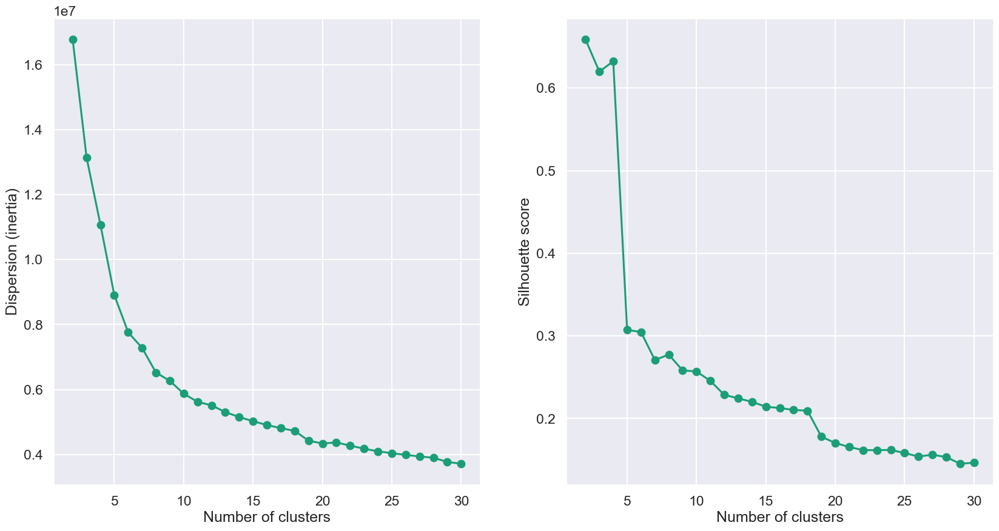

In [9]:
plot_inertia_and_silhouette(data_no)

---

### Hierarchical Clustering

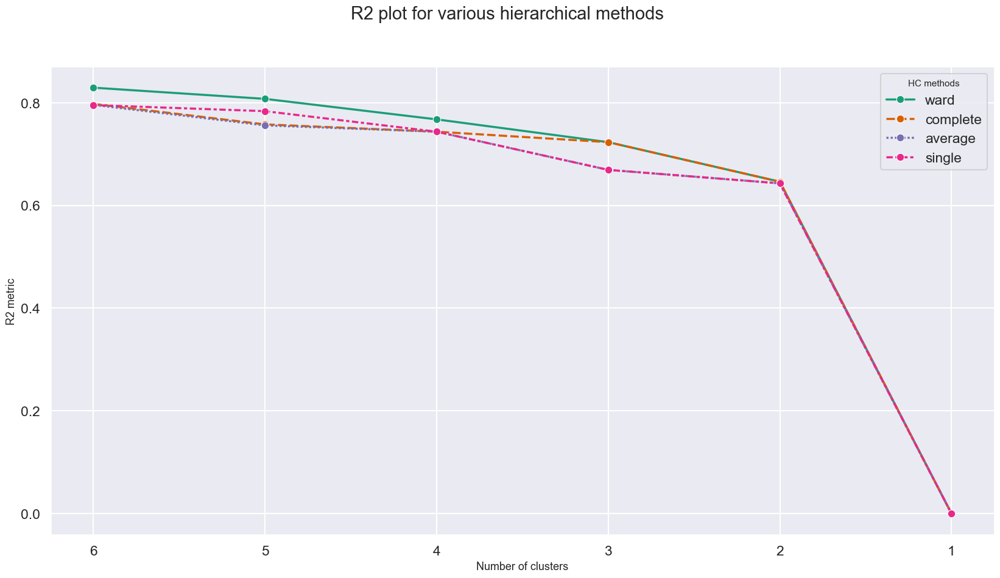

In [10]:
plot_r2_hc(data_no)

#### Single

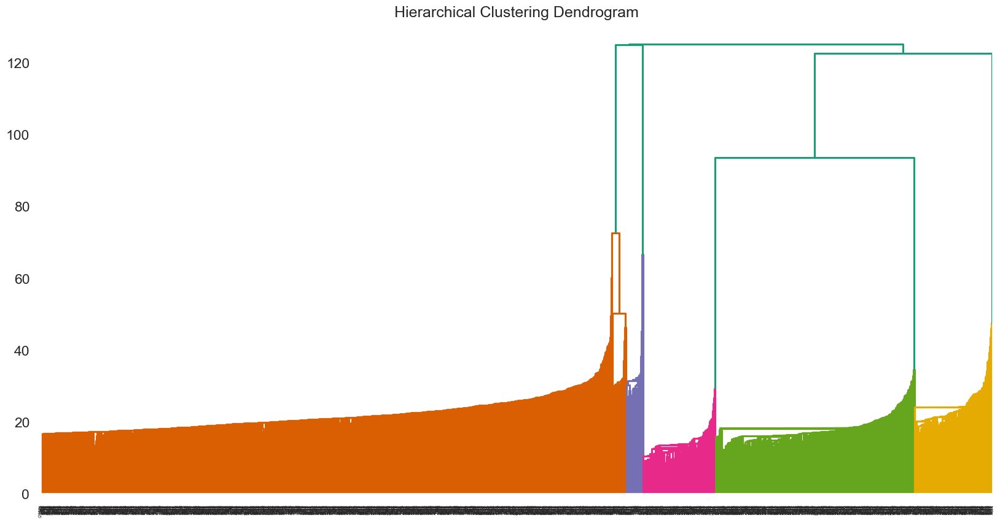

In [11]:
plot_dendrogram(data_no, 'single')

In [12]:
data['no_single2'] = AgglomerativeClustering(
    linkage='single', n_clusters=2
    ).fit_predict(data_no)

data['no_single4'] = AgglomerativeClustering(
    linkage='single', n_clusters=4
    ).fit_predict(data_no)

data['no_single5'] = AgglomerativeClustering(
    linkage='single', n_clusters=5
    ).fit_predict(data_no)

In [13]:
clusters_comparison(data, 'no_single5', 'no_single4')

,no_single4 0 Cluster,no_single4 1 Cluster,no_single4 2 Cluster,no_single4 3 Cluster
no_single5 0 Cluster,0,0,3512,0
no_single5 1 Cluster,0,42,0,0
no_single5 2 Cluster,496,0,0,0
no_single5 3 Cluster,0,0,0,194
no_single5 4 Cluster,180,0,0,0


In [15]:
data['no_single5'].value_counts()

no_single5
0    3512
2     496
3     194
4     180
1      42
Name: count, dtype: int64

In [16]:
groupby_mean(data, 'no_single5', features_means=True)

no_single5,0,1,2,3,4,MEAN
Course area_Art,0.066913,0.000000,0.028226,0.061856,1.000000,0.099684
Course area_Business sciences,0.204727,0.261905,0.272177,0.262887,0.000000,0.207052
Course area_Engineering and related techniques,0.032460,0.285714,0.092742,0.051546,0.000000,0.041139
Course area_Health,0.217540,0.119048,0.120968,0.118557,0.000000,0.192586
Course area_Information and journalism,0.080011,0.071429,0.058468,0.092784,0.000000,0.074819
Course area_Personal services,0.058087,0.023810,0.066532,0.072165,0.000000,0.056962
Course area_Social services,0.138098,0.023810,0.120968,0.123711,0.000000,0.128843
Course area_Teacher training/trainers and education sciences,0.047267,0.000000,0.036290,0.041237,0.000000,0.043400
Course area_Veterinary sciences,0.081435,0.095238,0.070565,0.061856,0.000000,0.076175
Marital status,0.895786,0.880952,0.794355,0.850515,0.983333,0.885850


---

#### Complete

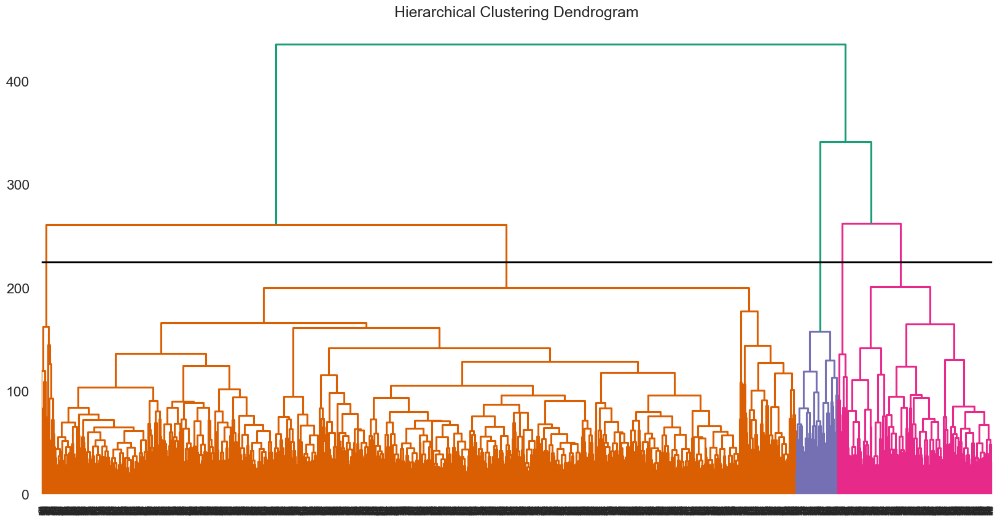

In [17]:
plot_dendrogram(data_no, 'complete', cut_line=225)

In [18]:
data['no_complete2'] = AgglomerativeClustering(
    linkage='complete', n_clusters=2
    ).fit_predict(data_no)

data['no_complete3'] = AgglomerativeClustering(
    linkage='complete', n_clusters=3
    ).fit_predict(data_no)

data['no_complete5'] = AgglomerativeClustering(
    linkage='complete', n_clusters=5
    ).fit_predict(data_no)

In [19]:
clusters_comparison(data, 'no_single2', 'no_complete2')

,no_complete2 0 Cluster,no_complete2 1 Cluster
no_single2 0 Cluster,42,3512
no_single2 1 Cluster,870,0


In [20]:
clusters_comparison(data, 'no_single5', 'no_complete3')

,no_complete3 0 Cluster,no_complete3 1 Cluster,no_complete3 2 Cluster
no_single5 0 Cluster,0,3512,0
no_single5 1 Cluster,42,0,0
no_single5 2 Cluster,496,0,0
no_single5 3 Cluster,0,0,194
no_single5 4 Cluster,180,0,0


In [21]:
clusters_comparison(data, 'no_single5', 'no_complete5')

,no_complete5 0 Cluster,no_complete5 1 Cluster,no_complete5 2 Cluster,no_complete5 3 Cluster,no_complete5 4 Cluster
no_single5 0 Cluster,0,3444,0,0,68
no_single5 1 Cluster,0,0,0,42,0
no_single5 2 Cluster,496,0,0,0,0
no_single5 3 Cluster,0,0,194,0,0
no_single5 4 Cluster,180,0,0,0,0


In [22]:
groupby_mean(data, 'no_complete5')

no_complete5,0,1,2,3,4
Course area_Art,0.286982,0.058072,0.061856,0.000000,0.514706
Course area_Business sciences,0.199704,0.207027,0.262887,0.261905,0.088235
Course area_Engineering and related techniques,0.068047,0.030197,0.051546,0.285714,0.147059
Course area_Health,0.088757,0.221254,0.118557,0.119048,0.029412
Course area_Information and journalism,0.042899,0.081301,0.092784,0.071429,0.014706
Course area_Personal services,0.048817,0.059233,0.072165,0.023810,0.000000
Course area_Social services,0.088757,0.139663,0.123711,0.023810,0.058824
Course area_Teacher training/trainers and education sciences,0.026627,0.048200,0.041237,0.000000,0.000000
Course area_Veterinary sciences,0.051775,0.082172,0.061856,0.095238,0.044118
Marital status,0.844675,0.894890,0.850515,0.880952,0.941176


---

#### Ward

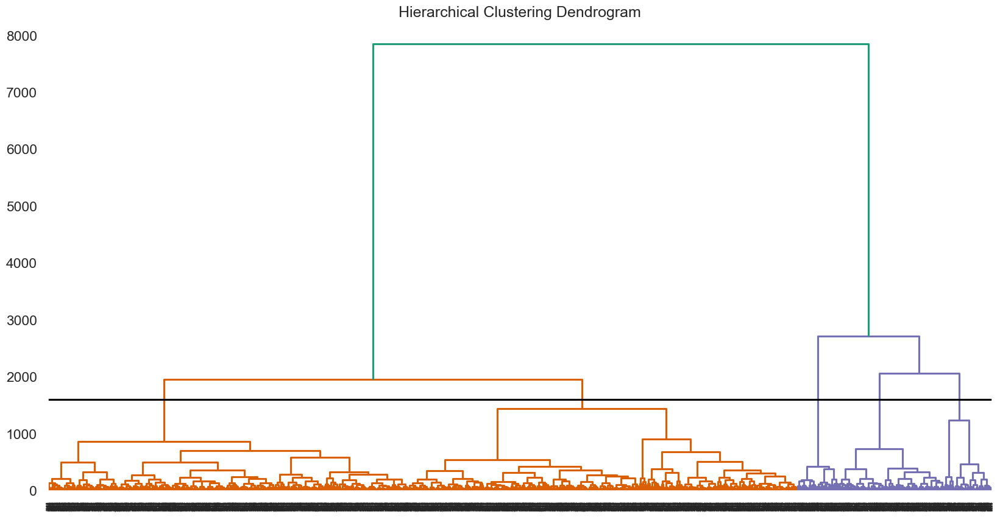

In [23]:
plot_dendrogram(data_no, 'ward', cut_line=1600)

In [20]:
data['no_ward2'] = AgglomerativeClustering(
    linkage='ward', n_clusters=2
    ).fit_predict(data_no)

data['no_ward5'] = AgglomerativeClustering(
    linkage='ward', n_clusters=5
    ).fit_predict(data_no)

In [25]:
clusters_comparison(data, 'no_single2', 'no_ward2')

,no_ward2 0 Cluster,no_ward2 1 Cluster
no_single2 0 Cluster,42,3512
no_single2 1 Cluster,870,0


In [26]:
clusters_comparison(data, 'no_single5', 'no_ward5')

,no_ward5 0 Cluster,no_ward5 1 Cluster,no_ward5 2 Cluster,no_ward5 3 Cluster,no_ward5 4 Cluster
no_single5 0 Cluster,1824,0,0,0,1688
no_single5 1 Cluster,0,42,0,0,0
no_single5 2 Cluster,0,0,0,496,0
no_single5 3 Cluster,0,0,194,0,0
no_single5 4 Cluster,0,180,0,0,0


In [27]:
clusters_comparison(data, 'no_complete5', 'no_ward5')

,no_ward5 0 Cluster,no_ward5 1 Cluster,no_ward5 2 Cluster,no_ward5 3 Cluster,no_ward5 4 Cluster
no_complete5 0 Cluster,0,180,0,496,0
no_complete5 1 Cluster,1756,0,0,0,1688
no_complete5 2 Cluster,0,0,194,0,0
no_complete5 3 Cluster,0,42,0,0,0
no_complete5 4 Cluster,68,0,0,0,0


In [28]:
groupby_mean(data, 'no_ward5')

no_ward5,0,1,2,3,4
Course area_Art,0.074013,0.810811,0.061856,0.028226,0.059242
Course area_Business sciences,0.195724,0.049550,0.262887,0.272177,0.214455
Course area_Engineering and related techniques,0.033443,0.054054,0.051546,0.092742,0.031398
Course area_Health,0.212171,0.022523,0.118557,0.120968,0.223341
Course area_Information and journalism,0.084430,0.013514,0.092784,0.058468,0.075237
Course area_Personal services,0.053728,0.004505,0.072165,0.066532,0.062796
Course area_Social services,0.133224,0.004505,0.123711,0.120968,0.143365
Course area_Teacher training/trainers and education sciences,0.044956,0.000000,0.041237,0.036290,0.049763
Course area_Veterinary sciences,0.083882,0.018018,0.061856,0.070565,0.078791
Marital status,0.893092,0.963964,0.850515,0.794355,0.898697


---

#### Average

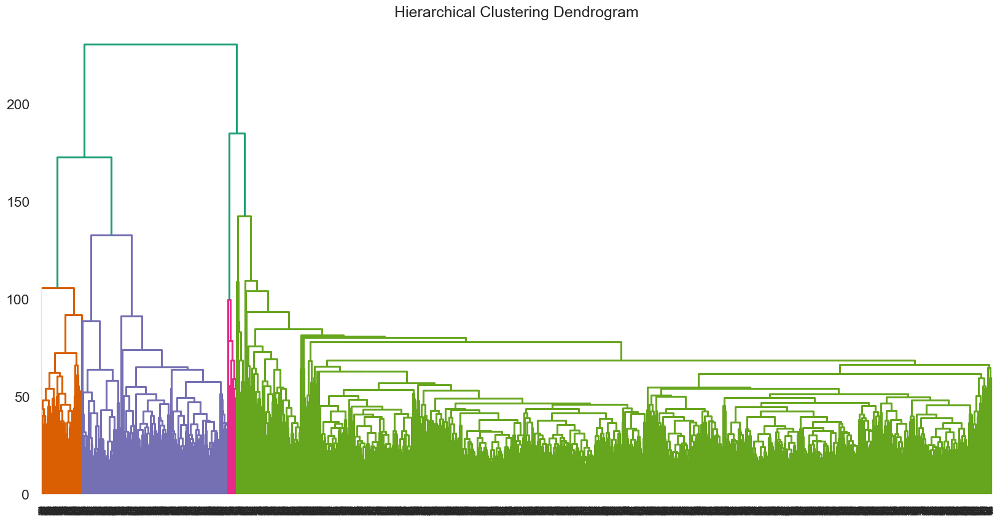

In [29]:
plot_dendrogram(data_no, 'average')

In [30]:
data['no_average2'] = AgglomerativeClustering(
    linkage='average', n_clusters=2
    ).fit_predict(data_no)

data['no_average4'] = AgglomerativeClustering(
    linkage='average', n_clusters=4
    ).fit_predict(data_no)

In [31]:
clusters_comparison(data, 'no_average2', 'no_single2')

,no_single2 0 Cluster,no_single2 1 Cluster
no_average2 0 Cluster,3554,0
no_average2 1 Cluster,0,870


In [32]:
clusters_comparison(data, 'no_average4', 'no_single5')

,no_single5 0 Cluster,no_single5 1 Cluster,no_single5 2 Cluster,no_single5 3 Cluster,no_single5 4 Cluster
no_average4 0 Cluster,3512,0,0,0,0
no_average4 1 Cluster,0,0,496,0,180
no_average4 2 Cluster,0,42,0,0,0
no_average4 3 Cluster,0,0,0,194,0


### MeanShift

In [33]:
no_meanshift2 = MeanShift(bandwidth=162, bin_seeding=True, n_jobs=-1).fit(data_no)
data['no_meanshift2'] = no_meanshift2.labels_

no_meanshift5 = MeanShift(bandwidth=80, bin_seeding=True, n_jobs=-1).fit(data_no)
data['no_meanshift5'] = no_meanshift5.labels_

In [34]:
clusters_comparison(data, 'no_single2', 'no_meanshift2')

,no_meanshift2 0 Cluster,no_meanshift2 1 Cluster
no_single2 0 Cluster,3523,31
no_single2 1 Cluster,1,869


In [35]:
clusters_comparison(data, 'no_single5', 'no_meanshift5')

,no_meanshift5 0 Cluster,no_meanshift5 1 Cluster,no_meanshift5 2 Cluster,no_meanshift5 3 Cluster,no_meanshift5 4 Cluster
no_single5 0 Cluster,3512,0,0,0,0
no_single5 1 Cluster,0,0,0,0,42
no_single5 2 Cluster,0,496,0,0,0
no_single5 3 Cluster,0,0,194,0,0
no_single5 4 Cluster,0,0,0,180,0


### UMAP

c:\Users\Afonso Cadete\anaconda3\envs\ml\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:387: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles = [plt.scatter([], [], c=cmap(norm(i)), label=label) for i, label in enumerate(labels)]


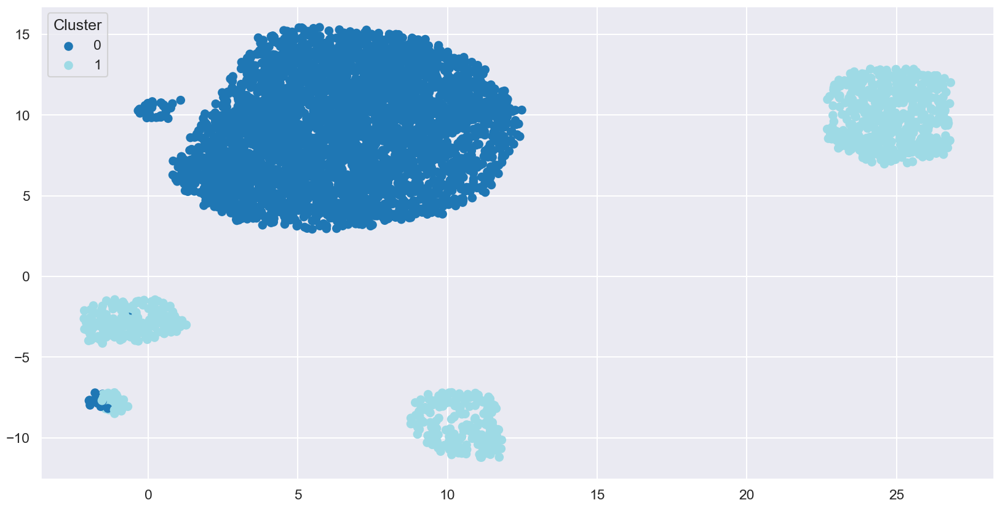

In [36]:
umap_object = umap.UMAP(n_neighbors=160, min_dist=1, random_state=16, n_jobs=-1)
umap_embedding = umap_object.fit_transform(data_no)
visualize_dimensionality_reduction(umap_embedding, data['no_meanshift2'])

c:\Users\Afonso Cadete\anaconda3\envs\ml\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:387: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles = [plt.scatter([], [], c=cmap(norm(i)), label=label) for i, label in enumerate(labels)]


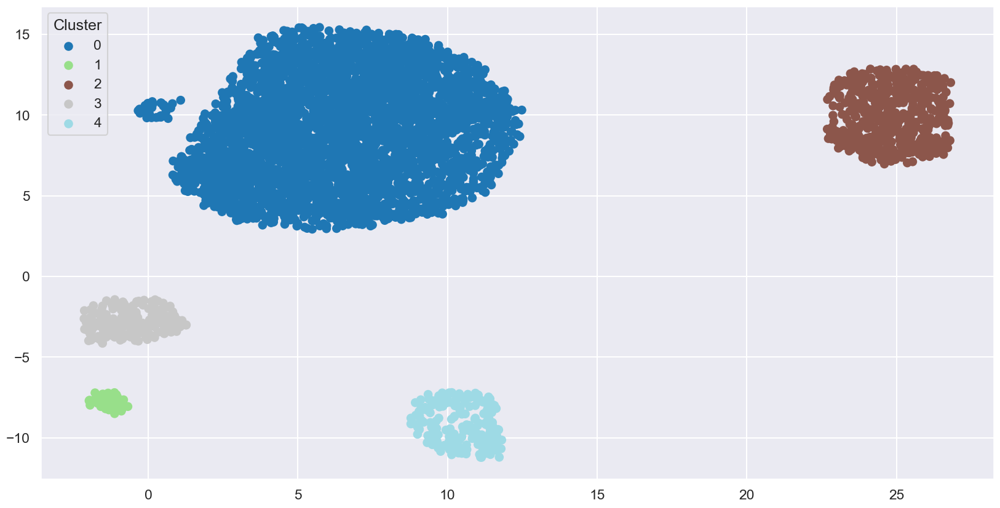

In [37]:
umap_object = umap.UMAP(n_neighbors=160, min_dist=1, random_state=16, n_jobs=-1)
umap_embedding = umap_object.fit_transform(data_no)
visualize_dimensionality_reduction(umap_embedding, data['no_single5'])

---
---

## MinMax

### KMeans

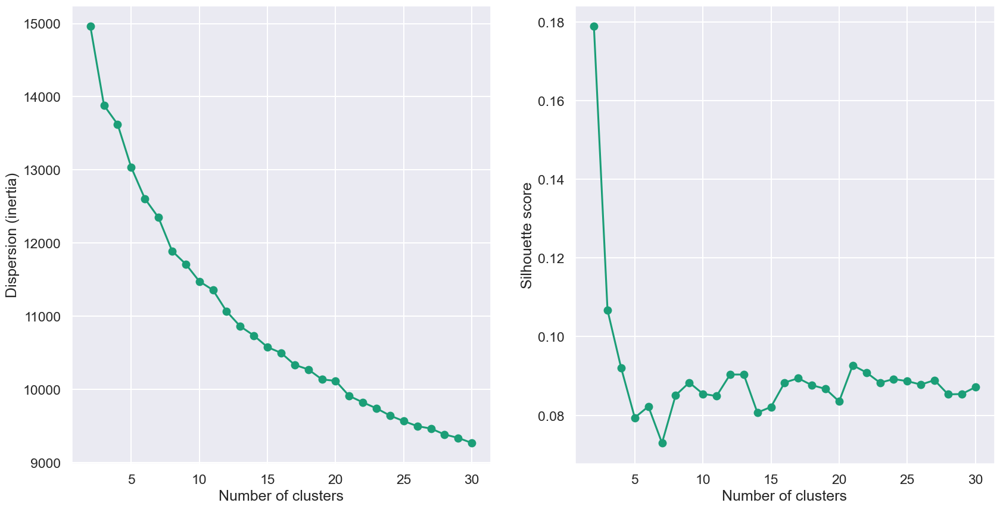

In [38]:
plot_inertia_and_silhouette(data_mm)

### Hierarchical

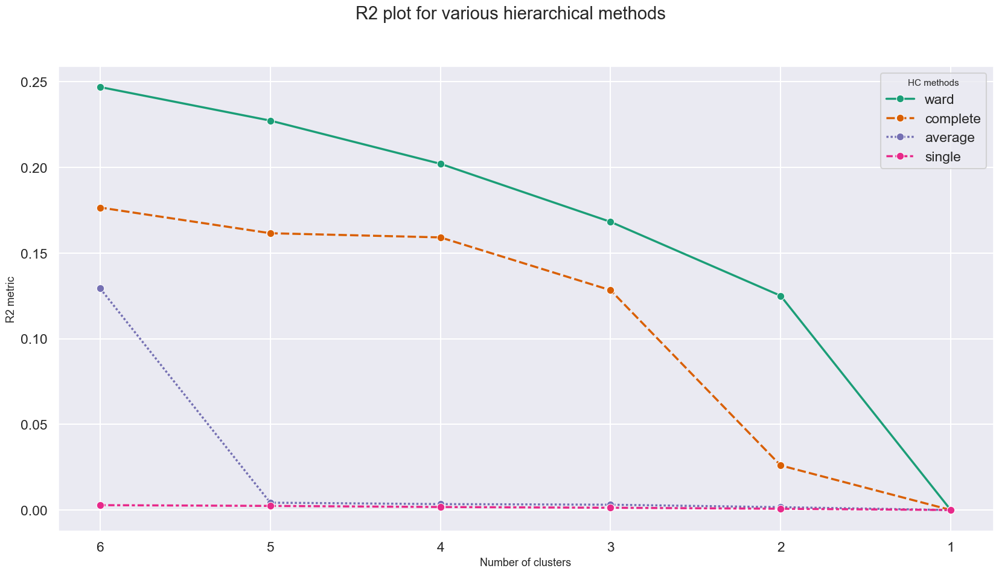

In [39]:
plot_r2_hc(data_mm)

## Robust

### KMeans

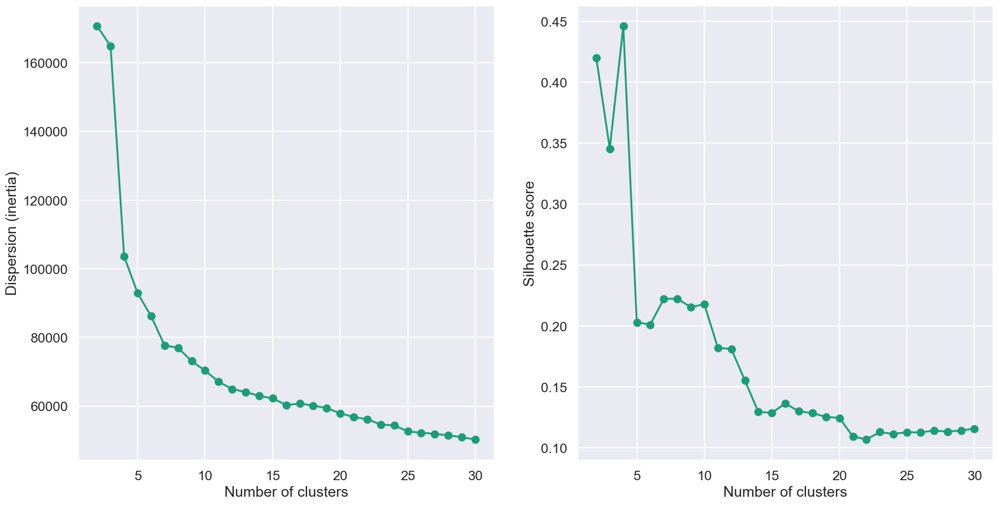

In [40]:
plot_inertia_and_silhouette(data_rb)

---

### Hierarchical Clustering

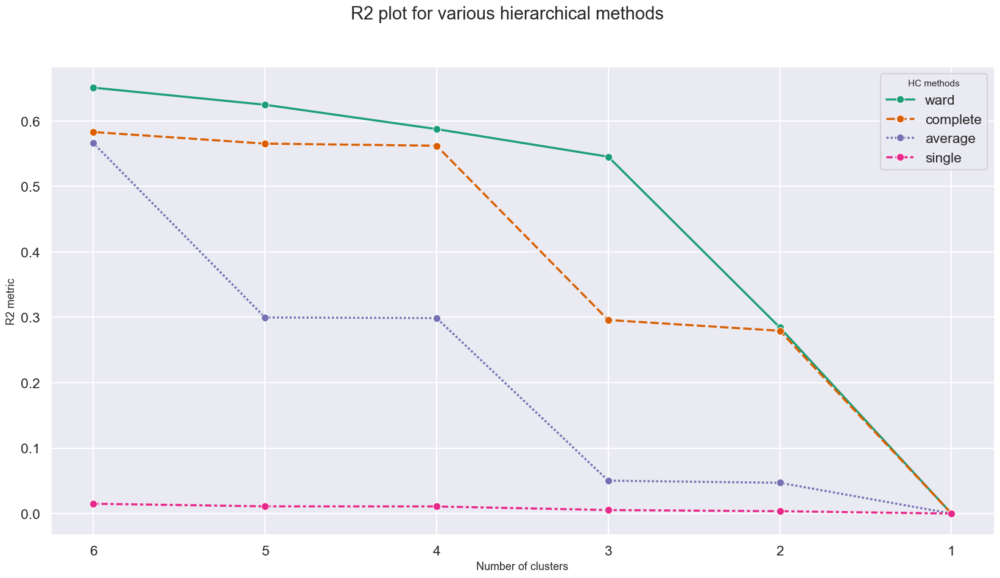

In [41]:
plot_r2_hc(data_rb)

#### Single

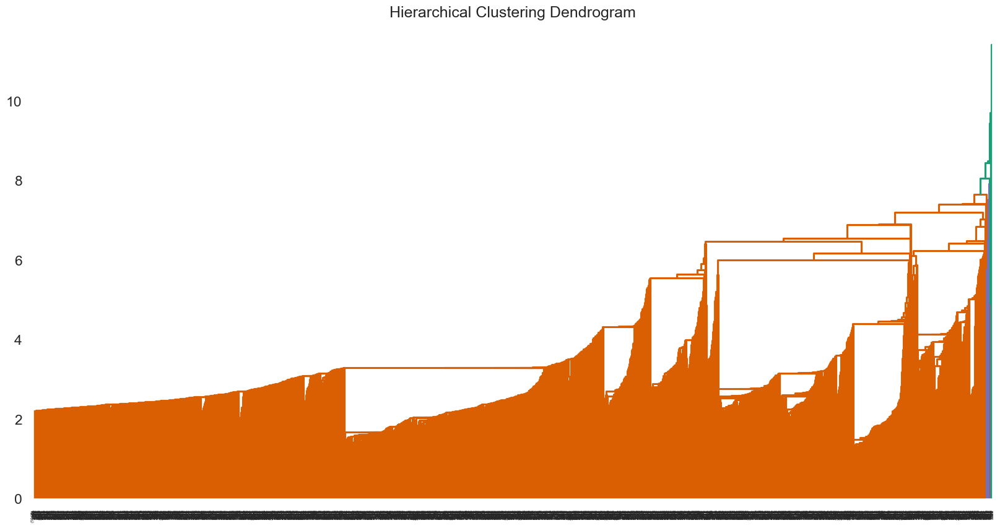

In [42]:
plot_dendrogram(data_rb, 'single')

---

#### Complete

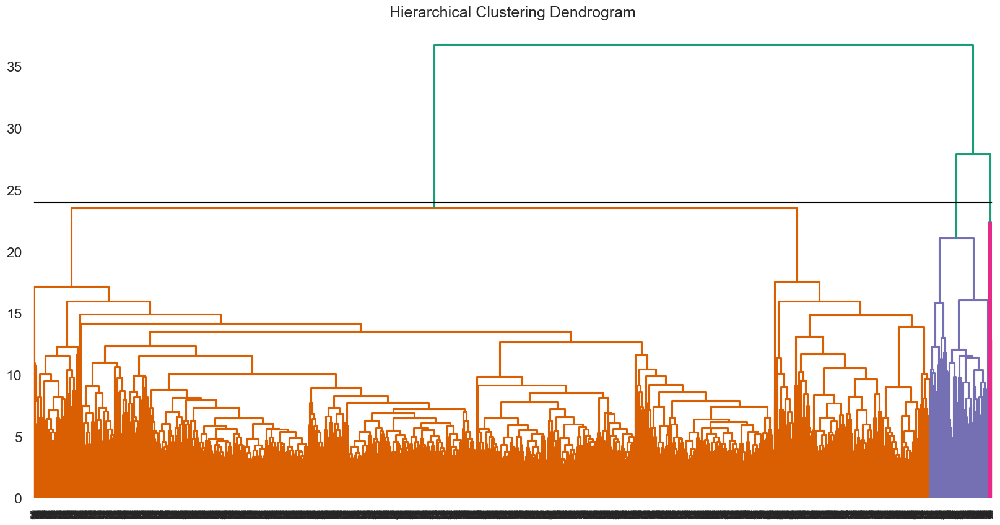

In [43]:
plot_dendrogram(data_rb, 'complete', cut_line=24)

In [44]:
data['rb_complete2'] = AgglomerativeClustering(
    linkage='complete', n_clusters=2
    ).fit_predict(data_rb)

data['rb_complete3'] = AgglomerativeClustering(
    linkage='complete', n_clusters=3
    ).fit_predict(data_rb)

In [45]:
clusters_comparison(data, 'rb_complete3', 'rb_complete2')

,rb_complete2 0 Cluster,rb_complete2 1 Cluster
rb_complete3 0 Cluster,0,4136
rb_complete3 1 Cluster,19,0
rb_complete3 2 Cluster,269,0


In [46]:
clusters_comparison(data, 'no_ward2', 'rb_complete2')

,rb_complete2 0 Cluster,rb_complete2 1 Cluster
no_ward2 0 Cluster,0,912
no_ward2 1 Cluster,288,3224


In [47]:
clusters_comparison(data, 'rb_complete3', 'no_single5')

,no_single5 0 Cluster,no_single5 1 Cluster,no_single5 2 Cluster,no_single5 3 Cluster,no_single5 4 Cluster
rb_complete3 0 Cluster,3224,42,496,194,180
rb_complete3 1 Cluster,19,0,0,0,0
rb_complete3 2 Cluster,269,0,0,0,0


In [48]:
groupby_mean(data, 'rb_complete2')

rb_complete2,0,1
Course area_Art,0.190972,0.093327
Course area_Business sciences,0.236111,0.205029
Course area_Engineering and related techniques,0.020833,0.042553
Course area_Health,0.052083,0.202369
Course area_Information and journalism,0.010417,0.079304
Course area_Personal services,0.020833,0.059478
Course area_Social services,0.197917,0.124033
Course area_Teacher training/trainers and education sciences,0.034722,0.044004
Course area_Veterinary sciences,0.072917,0.076402
Marital status,0.795139,0.892166


In [49]:
groupby_mean(data, 'rb_complete3')

rb_complete3,0,1,2
Course area_Art,0.093327,0.263158,0.185874
Course area_Business sciences,0.205029,0.000000,0.252788
Course area_Engineering and related techniques,0.042553,0.052632,0.018587
Course area_Health,0.202369,0.210526,0.040892
Course area_Information and journalism,0.079304,0.000000,0.011152
Course area_Personal services,0.059478,0.000000,0.022305
Course area_Social services,0.124033,0.000000,0.211896
Course area_Teacher training/trainers and education sciences,0.044004,0.210526,0.022305
Course area_Veterinary sciences,0.076402,0.105263,0.070632
Marital status,0.892166,0.894737,0.788104


---

#### Ward

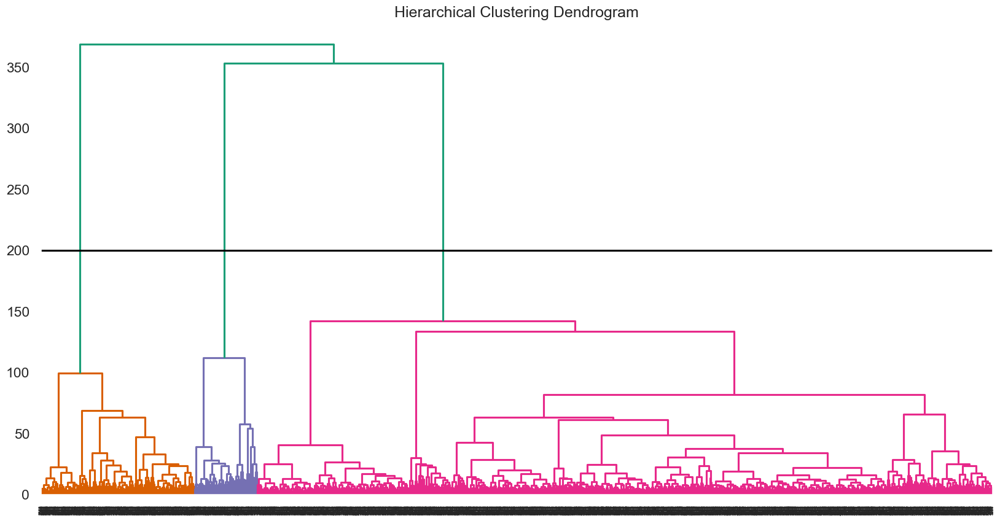

In [50]:
plot_dendrogram(data_rb, 'ward', cut_line=200)

In [51]:
data['rb_ward2'] = AgglomerativeClustering(
    linkage='ward', n_clusters=2
    ).fit_predict(data_rb)

data['rb_ward3'] = AgglomerativeClustering(
    linkage='ward', n_clusters=3
    ).fit_predict(data_rb)

In [52]:
clusters_comparison(data, 'rb_ward2', 'no_ward2')

,no_ward2 0 Cluster,no_ward2 1 Cluster
rb_ward2 0 Cluster,194,3512
rb_ward2 1 Cluster,718,0


In [53]:
clusters_comparison(data, 'rb_ward3', 'no_ward5')

,no_ward5 0 Cluster,no_ward5 1 Cluster,no_ward5 2 Cluster,no_ward5 3 Cluster,no_ward5 4 Cluster
rb_ward3 0 Cluster,1653,0,194,0,1570
rb_ward3 1 Cluster,0,222,0,496,0
rb_ward3 2 Cluster,171,0,0,0,118


In [54]:
clusters_comparison(data, 'rb_ward3', 'rb_complete3')

,rb_complete3 0 Cluster,rb_complete3 1 Cluster,rb_complete3 2 Cluster
rb_ward3 0 Cluster,3417,0,0
rb_ward3 1 Cluster,718,0,0
rb_ward3 2 Cluster,1,19,269


In [55]:
groupby_mean(data, 'rb_ward3')

rb_ward3,0,1,2
Course area_Art,0.056190,0.270195,0.190311
Course area_Business sciences,0.205443,0.203343,0.235294
Course area_Engineering and related techniques,0.034533,0.080780,0.020761
Course area_Health,0.225929,0.090529,0.051903
Course area_Information and journalism,0.086626,0.044568,0.010381
Course area_Personal services,0.062043,0.047354,0.020761
Course area_Social services,0.131987,0.084958,0.200692
Course area_Teacher training/trainers and education sciences,0.047995,0.025070,0.034602
Course area_Veterinary sciences,0.081065,0.054318,0.072664
Marital status,0.901668,0.846797,0.795848


---

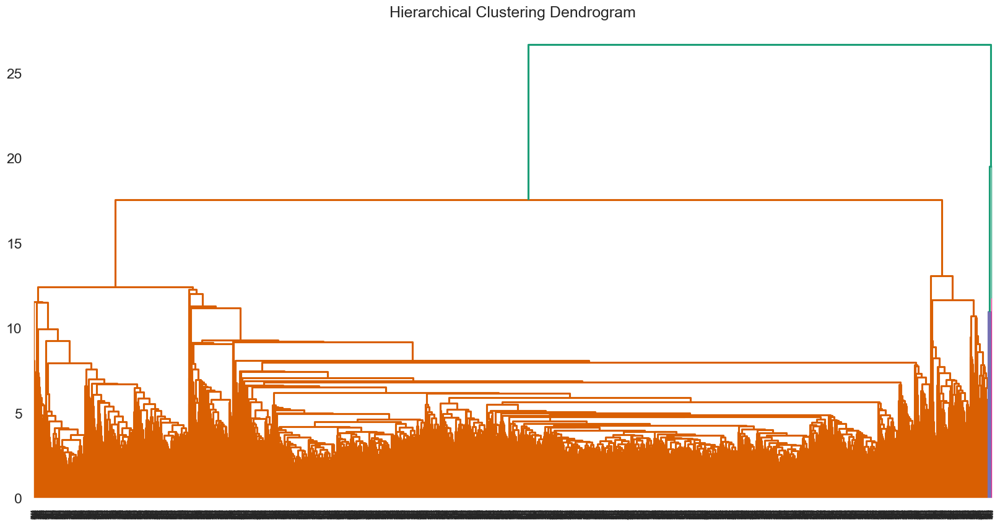

In [56]:
plot_dendrogram(data_rb, 'average')

### MeanShift

In [57]:
rb_meanshift2 = MeanShift(bandwidth=9, bin_seeding=True, n_jobs=-1).fit(data_rb)
data['rb_meanshift2'] = rb_meanshift2.labels_

rb_meanshift3 = MeanShift(bandwidth=7, bin_seeding=True, n_jobs=-1).fit(data_rb)
data['rb_meanshift3'] = rb_meanshift3.labels_

In [58]:
clusters_comparison(data, 'no_single2', 'rb_meanshift2')

,rb_meanshift2 0 Cluster,rb_meanshift2 1 Cluster
no_single2 0 Cluster,3268,286
no_single2 1 Cluster,870,0


In [59]:
clusters_comparison(data, 'rb_ward3', 'rb_meanshift3')

,rb_meanshift3 0 Cluster,rb_meanshift3 1 Cluster,rb_meanshift3 2 Cluster
rb_ward3 0 Cluster,3398,19,0
rb_ward3 1 Cluster,16,702,0
rb_ward3 2 Cluster,3,0,286


### UMAP

c:\Users\Afonso Cadete\anaconda3\envs\ml\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:387: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles = [plt.scatter([], [], c=cmap(norm(i)), label=label) for i, label in enumerate(labels)]


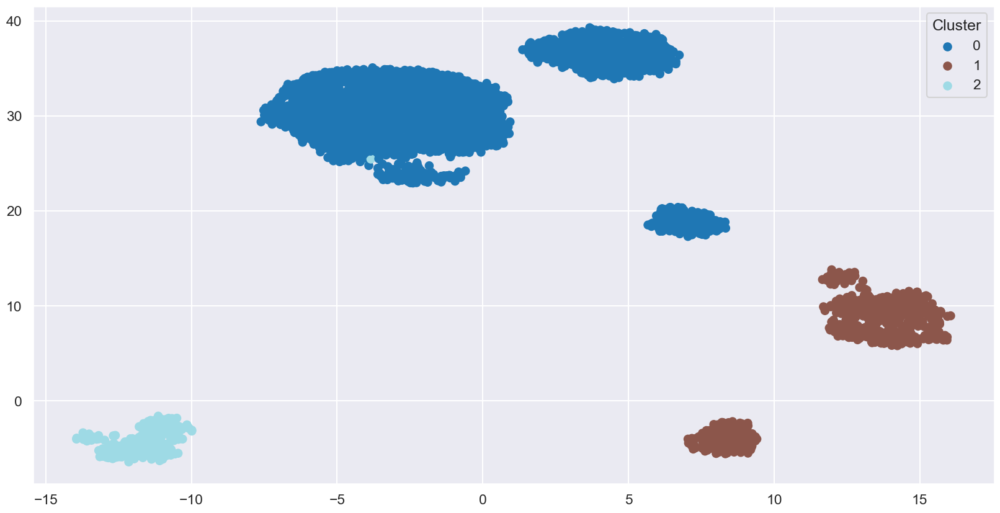

In [60]:
umap_object = umap.UMAP(n_neighbors=160, min_dist=1, random_state=16, n_jobs=-1)
umap_embedding = umap_object.fit_transform(data_rb)
visualize_dimensionality_reduction(umap_embedding, data['rb_ward3'])

---
---

## Yeo-Johnson

### KMeans

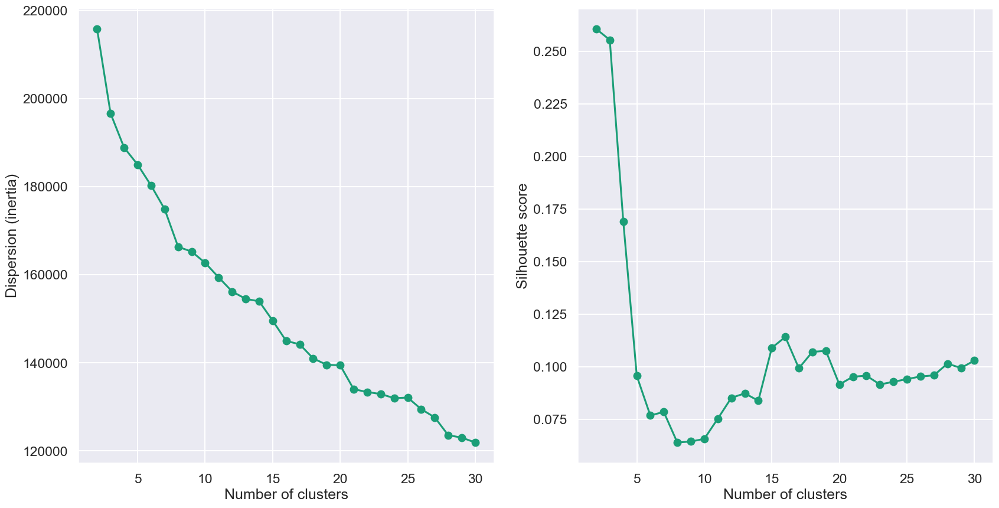

In [61]:
plot_inertia_and_silhouette(data_yj)

### Hierarchical

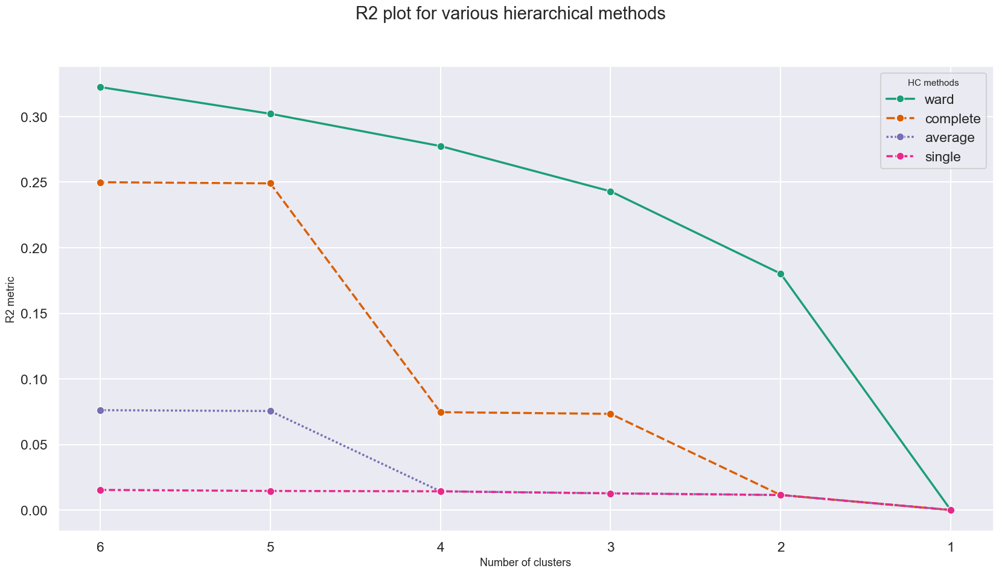

In [62]:
plot_r2_hc(data_yj)

## Means

In [22]:
groupby_mean(data, 'no_ward2', True)

no_ward2,0,1,MEAN
Course area_Art,0.225877,0.066913,0.099684
Course area_Business sciences,0.216009,0.204727,0.207052
Course area_Engineering and related techniques,0.074561,0.032460,0.041139
Course area_Health,0.096491,0.217540,0.192586
Course area_Information and journalism,0.054825,0.080011,0.074819
Course area_Personal services,0.052632,0.058087,0.056962
Course area_Social services,0.093202,0.138098,0.128843
Course area_Teacher training/trainers and education sciences,0.028509,0.047267,0.043400
Course area_Veterinary sciences,0.055921,0.081435,0.076175
Marital status,0.847588,0.895786,0.885850


## Manual Segmentation

In [30]:
insuccess_students_mask = (data_no['Average grade 1st period'] == 0) | (data_no['Average grade 2nd period'] == 0)

In [31]:
insuccess = data[insuccess_students_mask].iloc[:,:46]
insuccess_no = data_no[insuccess_students_mask]
# insuccess_mm = data_mm[insuccess_students_mask]
insuccess_rb = data_rb[insuccess_students_mask]
# insuccess_yj = data_yj[insuccess_students_mask]

success = data[~insuccess_students_mask].iloc[:,:46]
success_no = data_no[~insuccess_students_mask]
# success_mm = data_mm[~insuccess_students_mask]
success_rb = data_rb[~insuccess_students_mask]
# success_yj = data_yj[~insuccess_students_mask]

In [72]:
# success.to_csv('data\\success.csv', index='Used')
# success_no.to_csv('data\\success_no.csv', index='Used')
# success_rb.to_csv('data\\success_rb.csv', index='Used')

# insuccess.to_csv('data\\insuccess.csv', index='Used')
# insuccess_no.to_csv('data\\insuccess_no.csv', index='Used')
# insuccess_rb.to_csv('data\\insuccess_rb.csv', index='Used')

### Insuccess

#### No scaling

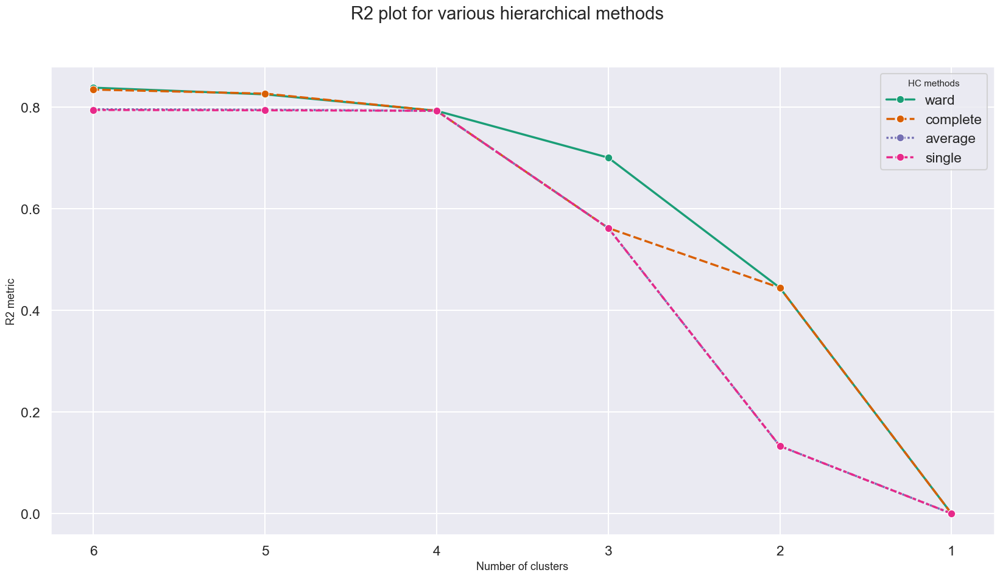

In [63]:
plot_r2_hc(insuccess_no)

##### Single

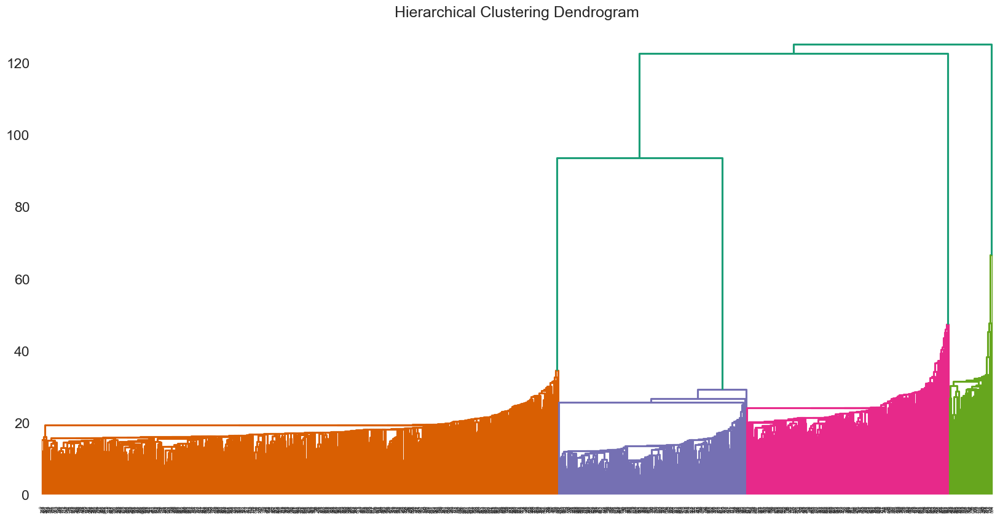

In [64]:
plot_dendrogram(insuccess_no, 'single')

In [32]:
insuccess['no_single3'] = AgglomerativeClustering(
    linkage='single', n_clusters=3
    ).fit_predict(insuccess_no)

insuccess['no_single4'] = AgglomerativeClustering(
    linkage='single', n_clusters=4
    ).fit_predict(insuccess_no)

In [66]:
clusters_comparison(insuccess, 'no_single3', 'no_single4')

,no_single4 0 Cluster,no_single4 1 Cluster,no_single4 2 Cluster,no_single4 3 Cluster
no_single3 0 Cluster,0,496,0,180
no_single3 1 Cluster,42,0,0,0
no_single3 2 Cluster,0,0,194,0


##### Complete

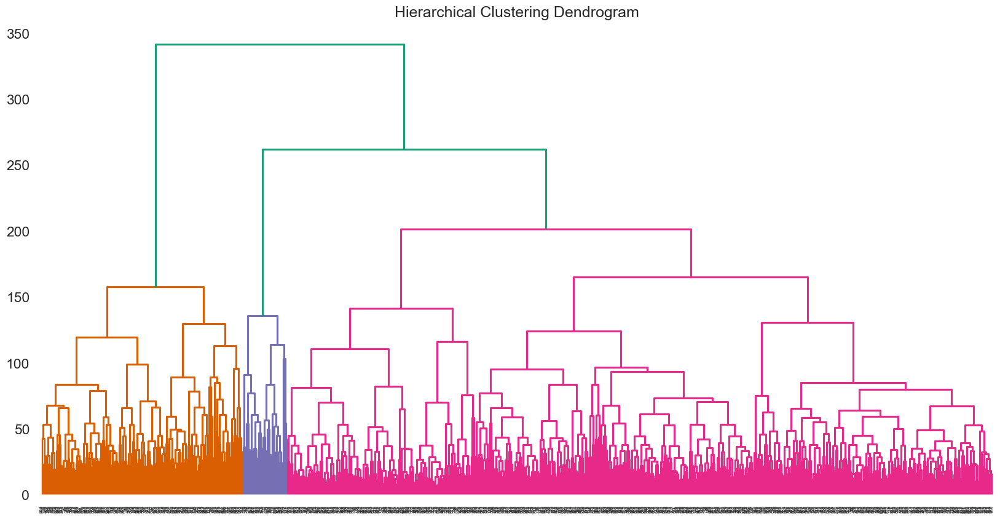

In [67]:
plot_dendrogram(insuccess_no, 'complete')

In [68]:
insuccess['no_complete3'] = AgglomerativeClustering(
    linkage='complete', n_clusters=3
    ).fit_predict(insuccess_no)

insuccess['no_complete4'] = AgglomerativeClustering(
    linkage='complete', n_clusters=4
    ).fit_predict(insuccess_no)

In [69]:
clusters_comparison(insuccess, 'no_single3', 'no_complete3')

,no_complete3 0 Cluster,no_complete3 1 Cluster,no_complete3 2 Cluster
no_single3 0 Cluster,676,0,0
no_single3 1 Cluster,0,0,42
no_single3 2 Cluster,0,194,0


In [70]:
clusters_comparison(insuccess, 'no_single4', 'no_complete4')

,no_complete4 0 Cluster,no_complete4 1 Cluster,no_complete4 2 Cluster,no_complete4 3 Cluster
no_single4 0 Cluster,0,0,42,0
no_single4 1 Cluster,496,0,0,0
no_single4 2 Cluster,0,194,0,0
no_single4 3 Cluster,0,0,0,180


##### Ward

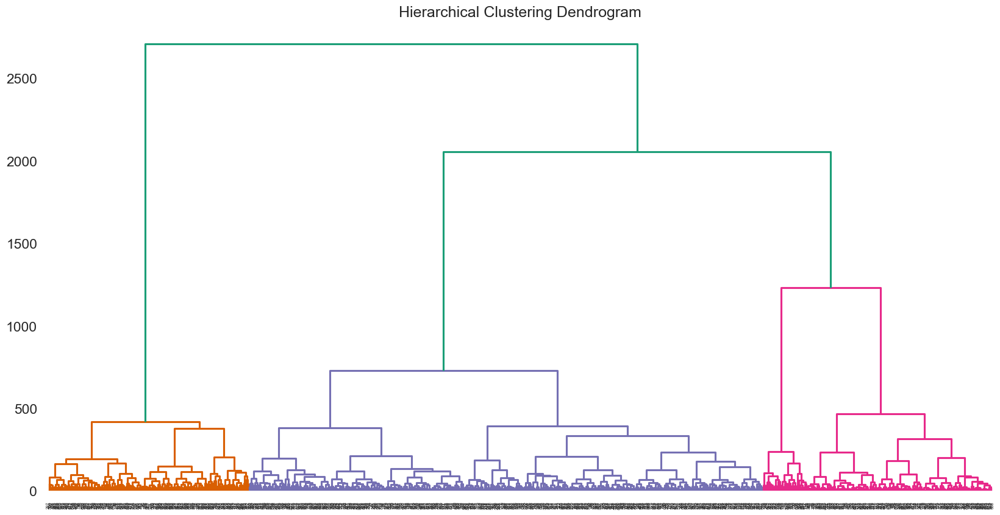

In [71]:
plot_dendrogram(insuccess_no, 'ward')

In [72]:
insuccess['no_ward3'] = AgglomerativeClustering(
    linkage='ward', n_clusters=3
    ).fit_predict(insuccess_no)

insuccess['no_ward4'] = AgglomerativeClustering(
    linkage='ward', n_clusters=4
    ).fit_predict(insuccess_no)

In [73]:
clusters_comparison(insuccess, 'no_single3', 'no_ward3')

,no_ward3 0 Cluster,no_ward3 1 Cluster,no_ward3 2 Cluster
no_single3 0 Cluster,180,0,496
no_single3 1 Cluster,42,0,0
no_single3 2 Cluster,0,194,0


In [74]:
clusters_comparison(insuccess, 'no_single4', 'no_ward4')

,no_ward4 0 Cluster,no_ward4 1 Cluster,no_ward4 2 Cluster,no_ward4 3 Cluster
no_single4 0 Cluster,0,0,0,42
no_single4 1 Cluster,496,0,0,0
no_single4 2 Cluster,0,194,0,0
no_single4 3 Cluster,0,0,180,0


##### Average

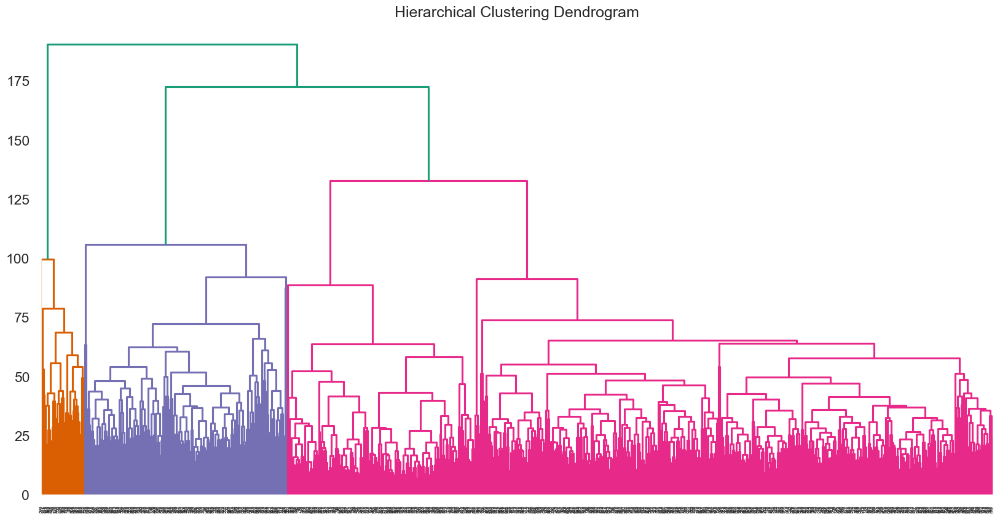

In [75]:
plot_dendrogram(insuccess_no, 'average')

In [76]:
insuccess['no_average3'] = AgglomerativeClustering(
    linkage='average', n_clusters=3
    ).fit_predict(insuccess_no)

insuccess['no_average4'] = AgglomerativeClustering(
    linkage='average', n_clusters=4
    ).fit_predict(insuccess_no)

In [77]:
clusters_comparison(insuccess, 'no_average3', 'no_single3')

,no_single3 0 Cluster,no_single3 1 Cluster,no_single3 2 Cluster
no_average3 0 Cluster,676,0,0
no_average3 1 Cluster,0,42,0
no_average3 2 Cluster,0,0,194


In [78]:
clusters_comparison(insuccess, 'no_average4', 'no_single4')

,no_single4 0 Cluster,no_single4 1 Cluster,no_single4 2 Cluster,no_single4 3 Cluster
no_average4 0 Cluster,0,0,194,0
no_average4 1 Cluster,42,0,0,0
no_average4 2 Cluster,0,496,0,0
no_average4 3 Cluster,0,0,0,180


##### MeanShift

In [79]:
no_meanshift = MeanShift(bandwidth=80, bin_seeding=True, n_jobs=-1).fit(insuccess_no)
insuccess['no_meanshift'] = no_meanshift.labels_

In [80]:
clusters_comparison(insuccess, 'no_meanshift', 'no_single4')

,no_single4 0 Cluster,no_single4 1 Cluster,no_single4 2 Cluster,no_single4 3 Cluster
no_meanshift 0 Cluster,0,496,0,0
no_meanshift 1 Cluster,0,0,194,0
no_meanshift 2 Cluster,0,0,0,180
no_meanshift 3 Cluster,42,0,0,0


##### UMAP

c:\Users\Afonso Cadete\anaconda3\envs\ml\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:387: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles = [plt.scatter([], [], c=cmap(norm(i)), label=label) for i, label in enumerate(labels)]


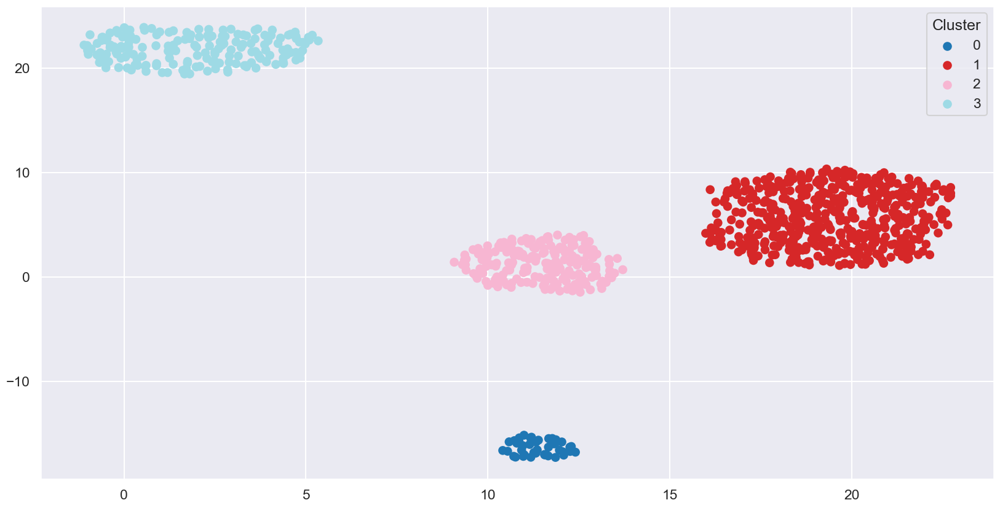

In [33]:
umap_object = umap.UMAP(n_neighbors=160, min_dist=1, random_state=16, n_jobs=-1)
umap_embedding = umap_object.fit_transform(insuccess_no)
visualize_dimensionality_reduction(umap_embedding, insuccess['no_single4'])

#### Robust

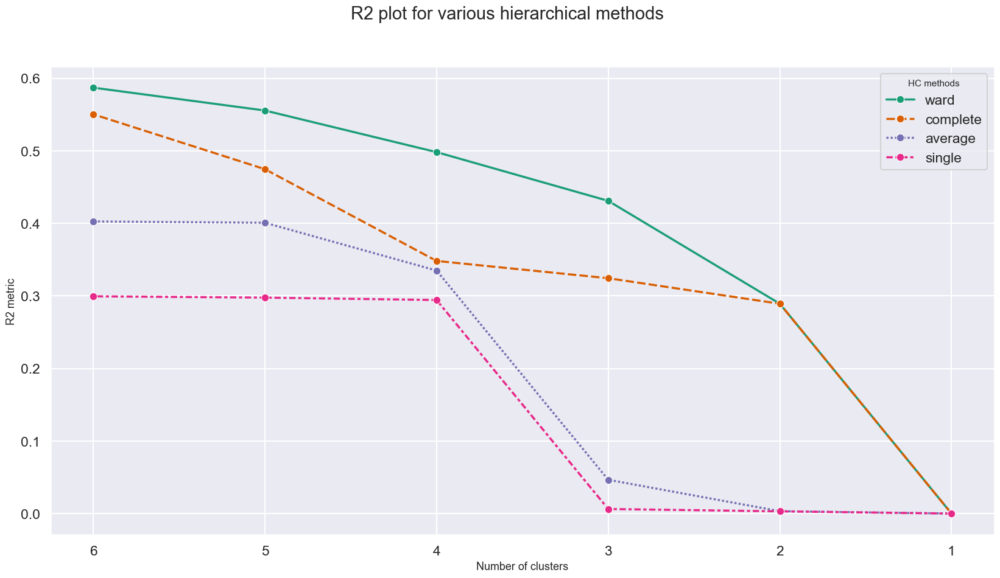

In [82]:
plot_r2_hc(insuccess_rb)

##### Complete

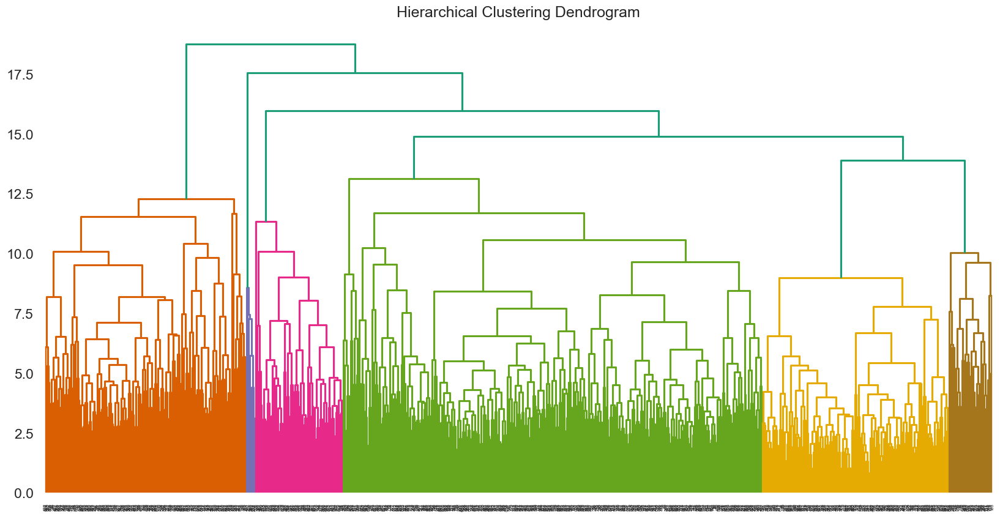

In [83]:
plot_dendrogram(insuccess_rb, 'complete')

In [84]:
insuccess['rb_complete3'] = AgglomerativeClustering(
    linkage='complete', n_clusters=3
    ).fit_predict(insuccess_rb)

insuccess['rb_complete4'] = AgglomerativeClustering(
    linkage='complete', n_clusters=4
    ).fit_predict(insuccess_rb)

insuccess['rb_complete5'] = AgglomerativeClustering(
    linkage='complete', n_clusters=5
    ).fit_predict(insuccess_rb)

insuccess['rb_complete6'] = AgglomerativeClustering(
    linkage='complete', n_clusters=6
    ).fit_predict(insuccess_rb)

In [85]:
clusters_comparison(insuccess, 'rb_complete3', 'no_single3')

,no_single3 0 Cluster,no_single3 1 Cluster,no_single3 2 Cluster
rb_complete3 0 Cluster,667,42,0
rb_complete3 1 Cluster,0,0,194
rb_complete3 2 Cluster,9,0,0


In [86]:
clusters_comparison(insuccess, 'rb_complete4', 'no_single4')

,no_single4 0 Cluster,no_single4 1 Cluster,no_single4 2 Cluster,no_single4 3 Cluster
rb_complete4 0 Cluster,42,403,0,180
rb_complete4 1 Cluster,0,0,194,0
rb_complete4 2 Cluster,0,9,0,0
rb_complete4 3 Cluster,0,84,0,0


In [87]:
clusters_comparison(insuccess, 'rb_complete6', 'no_single3')

,no_single3 0 Cluster,no_single3 1 Cluster,no_single3 2 Cluster
rb_complete6 0 Cluster,403,0,0
rb_complete6 1 Cluster,0,0,194
rb_complete6 2 Cluster,180,0,0
rb_complete6 3 Cluster,84,0,0
rb_complete6 4 Cluster,0,42,0
rb_complete6 5 Cluster,9,0,0


In [88]:
clusters_comparison(insuccess, 'rb_complete6', 'no_single4')

,no_single4 0 Cluster,no_single4 1 Cluster,no_single4 2 Cluster,no_single4 3 Cluster
rb_complete6 0 Cluster,0,403,0,0
rb_complete6 1 Cluster,0,0,194,0
rb_complete6 2 Cluster,0,0,0,180
rb_complete6 3 Cluster,0,84,0,0
rb_complete6 4 Cluster,42,0,0,0
rb_complete6 5 Cluster,0,9,0,0


##### Ward

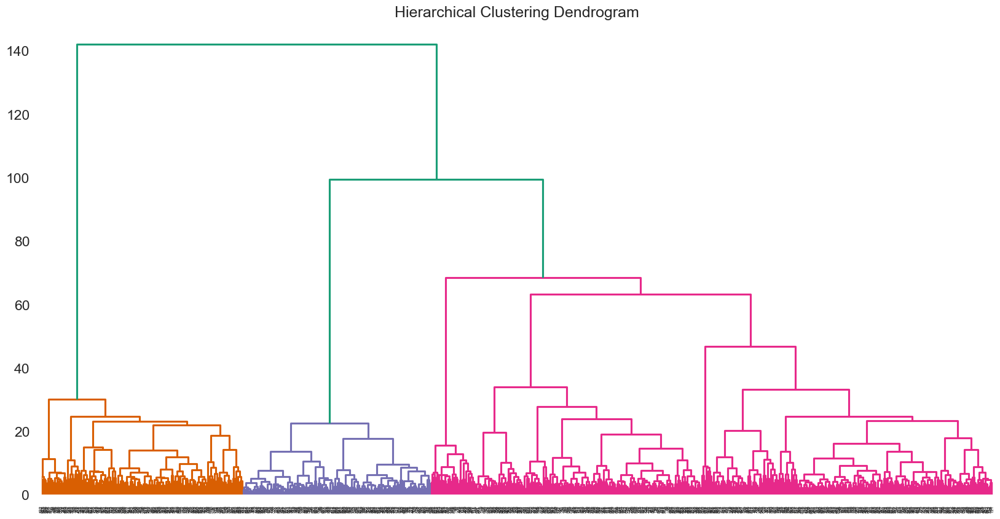

In [89]:
plot_dendrogram(insuccess_rb, 'ward')

In [90]:
insuccess['rb_ward3'] = AgglomerativeClustering(
    linkage='ward', n_clusters=3
    ).fit_predict(insuccess_rb)

insuccess['rb_ward4'] = AgglomerativeClustering(
    linkage='ward', n_clusters=4
    ).fit_predict(insuccess_rb)

insuccess['rb_ward5'] = AgglomerativeClustering(
    linkage='ward', n_clusters=5
    ).fit_predict(insuccess_rb)

insuccess['rb_ward6'] = AgglomerativeClustering(
    linkage='ward', n_clusters=6
    ).fit_predict(insuccess_rb)

In [91]:
clusters_comparison(insuccess, 'rb_complete3', 'rb_ward3')

,rb_ward3 0 Cluster,rb_ward3 1 Cluster,rb_ward3 2 Cluster
rb_complete3 0 Cluster,529,0,180
rb_complete3 1 Cluster,0,194,0
rb_complete3 2 Cluster,9,0,0


In [92]:
clusters_comparison(insuccess, 'rb_complete4', 'rb_ward4')

,rb_ward4 0 Cluster,rb_ward4 1 Cluster,rb_ward4 2 Cluster,rb_ward4 3 Cluster
rb_complete4 0 Cluster,403,0,180,42
rb_complete4 1 Cluster,0,194,0,0
rb_complete4 2 Cluster,9,0,0,0
rb_complete4 3 Cluster,84,0,0,0


In [93]:
clusters_comparison(insuccess, 'no_single4', 'rb_ward4')

,rb_ward4 0 Cluster,rb_ward4 1 Cluster,rb_ward4 2 Cluster,rb_ward4 3 Cluster
no_single4 0 Cluster,0,0,0,42
no_single4 1 Cluster,496,0,0,0
no_single4 2 Cluster,0,194,0,0
no_single4 3 Cluster,0,0,180,0


In [94]:
clusters_comparison(insuccess, 'rb_complete6', 'rb_ward6')

,rb_ward6 0 Cluster,rb_ward6 1 Cluster,rb_ward6 2 Cluster,rb_ward6 3 Cluster,rb_ward6 4 Cluster,rb_ward6 5 Cluster
rb_complete6 0 Cluster,180,222,0,0,0,1
rb_complete6 1 Cluster,0,0,0,0,194,0
rb_complete6 2 Cluster,0,0,180,0,0,0
rb_complete6 3 Cluster,37,47,0,0,0,0
rb_complete6 4 Cluster,0,0,0,42,0,0
rb_complete6 5 Cluster,0,0,0,0,0,9


##### MeanShift

In [95]:
rb_meanshift = MeanShift(bandwidth=6, bin_seeding=True, n_jobs=-1).fit(insuccess_rb)
insuccess['rb_meanshift'] = rb_meanshift.labels_

In [96]:
clusters_comparison(insuccess, 'no_meanshift', 'rb_meanshift')

,rb_meanshift 0 Cluster,rb_meanshift 1 Cluster,rb_meanshift 2 Cluster,rb_meanshift 3 Cluster
no_meanshift 0 Cluster,495,0,0,1
no_meanshift 1 Cluster,0,190,0,4
no_meanshift 2 Cluster,180,0,0,0
no_meanshift 3 Cluster,0,0,42,0


##### UMAP

c:\Users\Afonso Cadete\anaconda3\envs\ml\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:387: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles = [plt.scatter([], [], c=cmap(norm(i)), label=label) for i, label in enumerate(labels)]


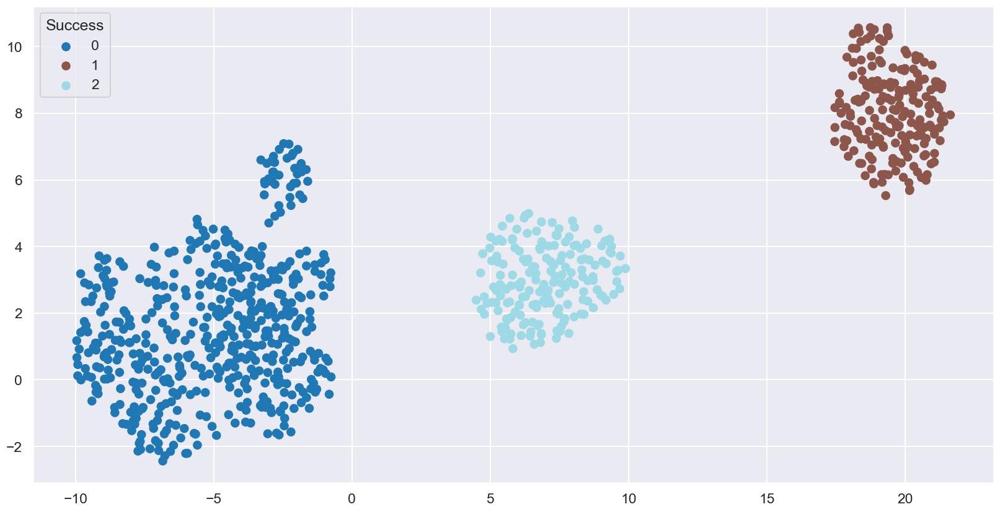

In [97]:
umap_object = umap.UMAP(n_neighbors=160, min_dist=1, random_state=16, n_jobs=-1)
umap_embedding = umap_object.fit_transform(insuccess_rb)
visualize_dimensionality_reduction(umap_embedding, insuccess['rb_ward3'])

#### Means

In [98]:
groupby_mean(insuccess, 'no_single4', True)

no_single4,0,1,2,3,MEAN
Course area_Art,0.000000,0.028226,0.061856,1.000000,0.225877
Course area_Business sciences,0.261905,0.272177,0.262887,0.000000,0.216009
Course area_Engineering and related techniques,0.285714,0.092742,0.051546,0.000000,0.074561
Course area_Health,0.119048,0.120968,0.118557,0.000000,0.096491
Course area_Information and journalism,0.071429,0.058468,0.092784,0.000000,0.054825
Course area_Personal services,0.023810,0.066532,0.072165,0.000000,0.052632
Course area_Social services,0.023810,0.120968,0.123711,0.000000,0.093202
Course area_Teacher training/trainers and education sciences,0.000000,0.036290,0.041237,0.000000,0.028509
Course area_Veterinary sciences,0.095238,0.070565,0.061856,0.000000,0.055921
Marital status,0.880952,0.794355,0.850515,0.983333,0.847588


0: focused in engineering; application mode 0; less displaced; no special needs; pretty "amasculated"; low external funding; take units but insuccefully specially in 1st period
<br>
1: slighly more non-single; lowest parents qualifications; lowest displaced; more debts; lowest fees regularization; lowest external funding; older; take units but nothing was approved
<br>
2: most skilled parents; highest debts; low fees regularization; low external funding; take units but insuccefully specially in 2nd period
<br>
3: all from art; almost all single; better parents qualifications; better previous grades; mostly displaced; "amasculated"; younger; no university

### Success

#### No scaling

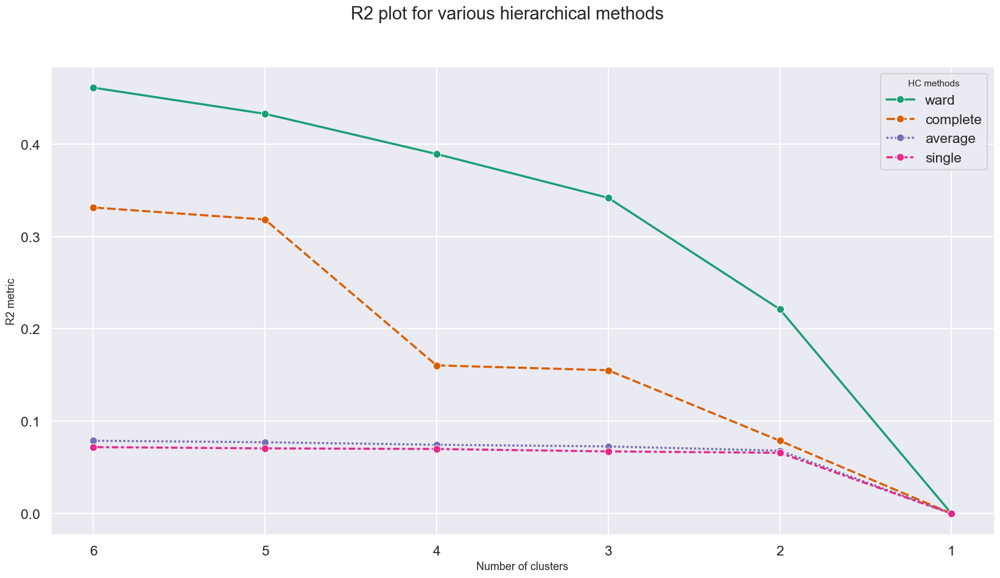

In [100]:
plot_r2_hc(success_no)

##### Complete

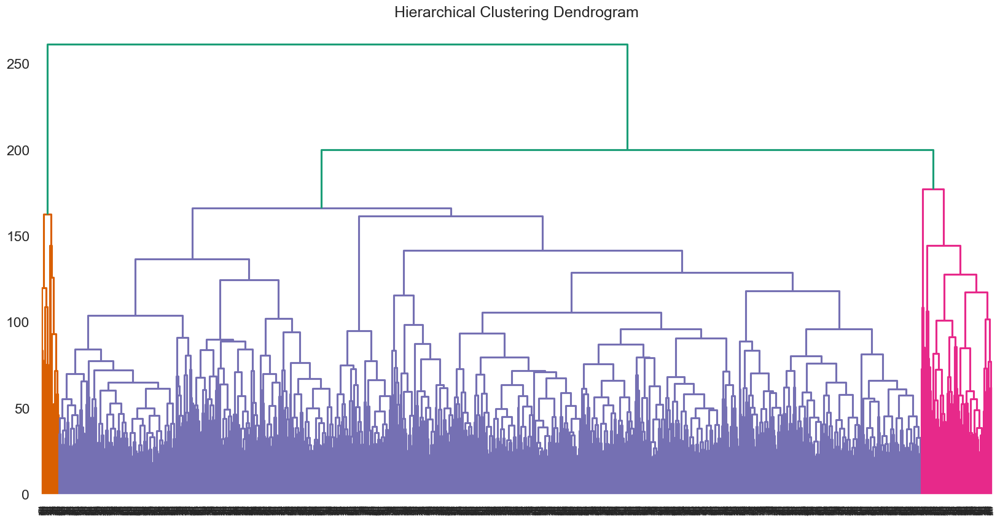

In [101]:
plot_dendrogram(success_no, 'complete')

In [102]:
success['no_complete2'] = AgglomerativeClustering(
    linkage='complete', n_clusters=2
    ).fit_predict(success_no)

success['no_complete3'] = AgglomerativeClustering(
    linkage='complete', n_clusters=3
    ).fit_predict(success_no)

success['no_complete4'] = AgglomerativeClustering(
    linkage='complete', n_clusters=4
    ).fit_predict(success_no)

In [103]:
clusters_comparison(success, 'no_complete2', 'no_complete3')

,no_complete3 0 Cluster,no_complete3 1 Cluster,no_complete3 2 Cluster
no_complete2 0 Cluster,262,0,3182
no_complete2 1 Cluster,0,68,0


In [104]:
clusters_comparison(success, 'no_complete3', 'no_complete4')

,no_complete4 0 Cluster,no_complete4 1 Cluster,no_complete4 2 Cluster,no_complete4 3 Cluster
no_complete3 0 Cluster,0,0,246,16
no_complete3 1 Cluster,0,68,0,0
no_complete3 2 Cluster,3182,0,0,0


##### Ward

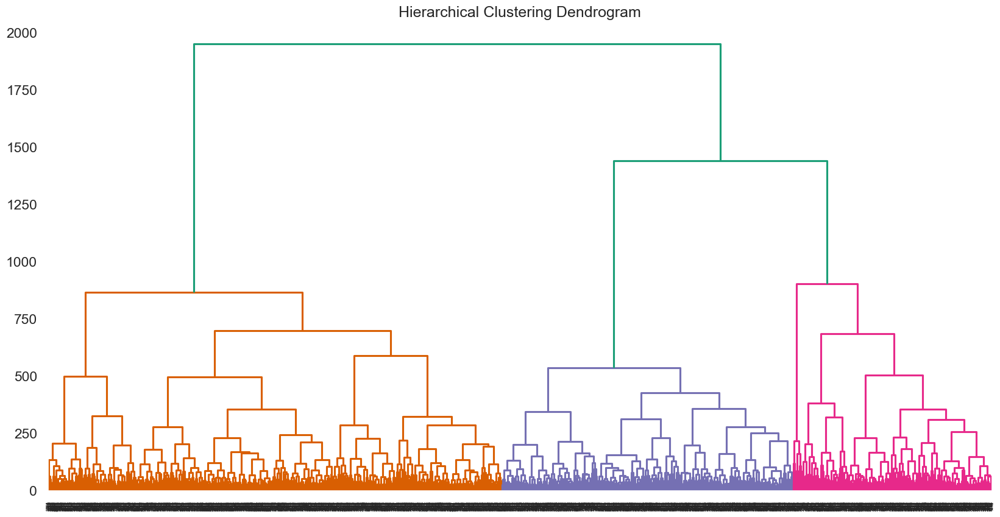

In [105]:
plot_dendrogram(success_no, 'ward')

In [12]:
success['no_ward2'] = AgglomerativeClustering(
    linkage='ward', n_clusters=2
    ).fit_predict(success_no)

success['no_ward3'] = AgglomerativeClustering(
    linkage='ward', n_clusters=3
    ).fit_predict(success_no)

In [107]:
clusters_comparison(success, 'no_complete2', 'no_ward2')

,no_ward2 0 Cluster,no_ward2 1 Cluster
no_complete2 0 Cluster,1756,1688
no_complete2 1 Cluster,68,0


In [108]:
clusters_comparison(success, 'no_complete3', 'no_ward3')

,no_ward3 0 Cluster,no_ward3 1 Cluster,no_ward3 2 Cluster
no_complete3 0 Cluster,157,87,18
no_complete3 1 Cluster,68,0,0
no_complete3 2 Cluster,516,1601,1065


In [109]:
clusters_comparison(success, 'no_complete4', 'no_ward3')

,no_ward3 0 Cluster,no_ward3 1 Cluster,no_ward3 2 Cluster
no_complete4 0 Cluster,516,1601,1065
no_complete4 1 Cluster,68,0,0
no_complete4 2 Cluster,149,86,11
no_complete4 3 Cluster,8,1,7


##### MeanShift

In [110]:
no_meanshift = MeanShift(bandwidth=48, bin_seeding=True, n_jobs=-1).fit(success_no)
success['no_meanshift'] = no_meanshift.labels_

In [111]:
clusters_comparison(success, 'no_meanshift', 'no_complete2')

,no_complete2 0 Cluster,no_complete2 1 Cluster
no_meanshift 0 Cluster,3400,6
no_meanshift 1 Cluster,44,62


##### UMAP

c:\Users\Afonso Cadete\anaconda3\envs\ml\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:387: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles = [plt.scatter([], [], c=cmap(norm(i)), label=label) for i, label in enumerate(labels)]


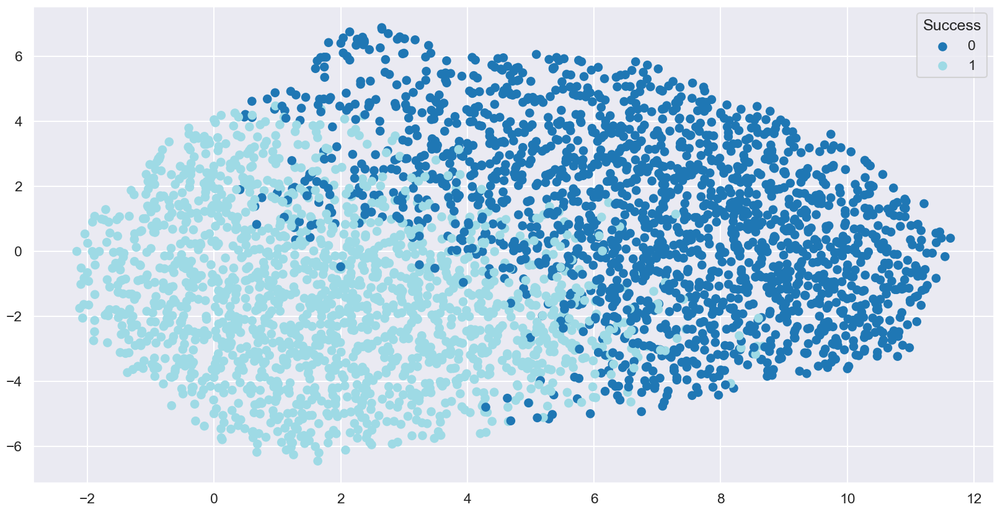

In [15]:
umap_object = umap.UMAP(n_neighbors=160, min_dist=1, random_state=16, n_jobs=-1)
umap_embedding = umap_object.fit_transform(success_no)
visualize_dimensionality_reduction(umap_embedding, success['no_ward2'])

#### Robust

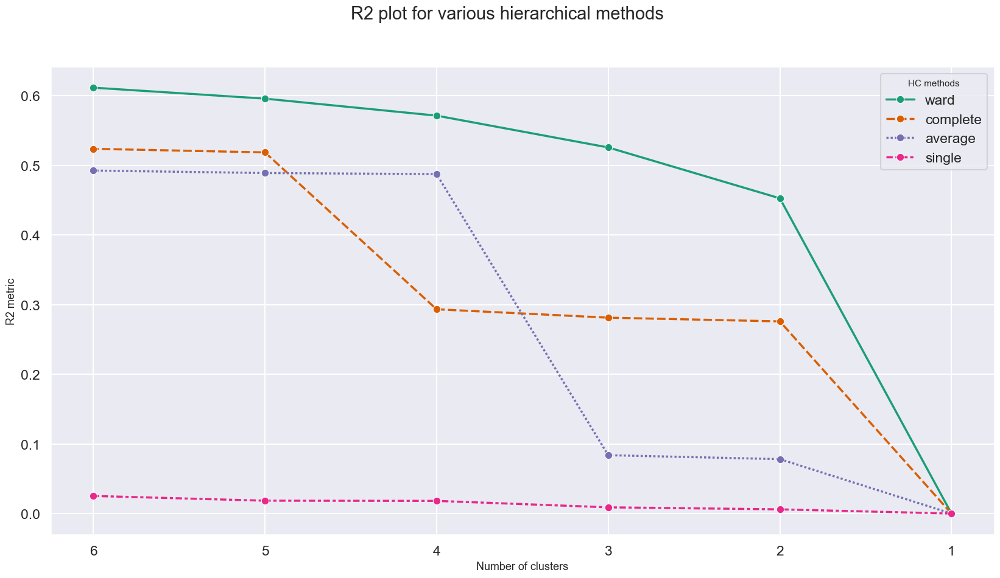

In [114]:
plot_r2_hc(success_rb)

##### Complete

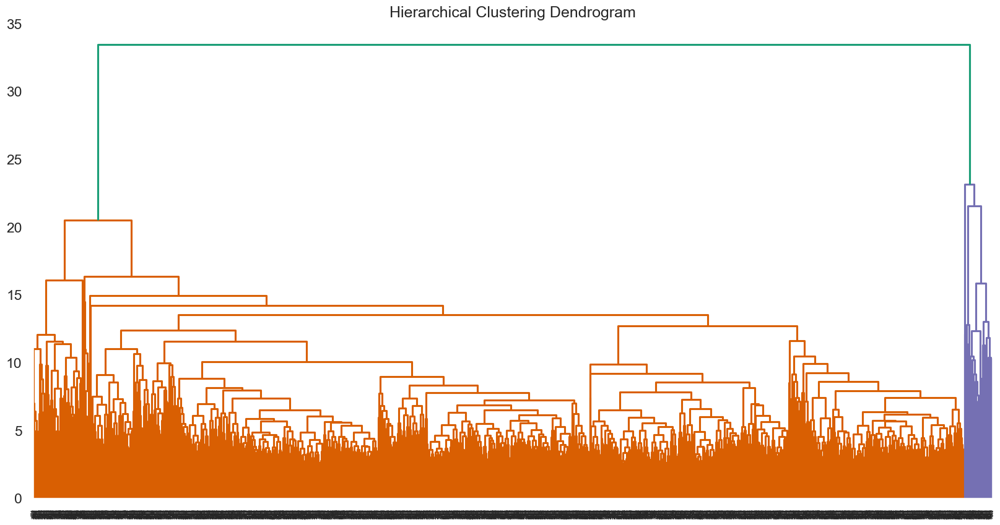

In [115]:
plot_dendrogram(success_rb, 'complete')

In [116]:
success['rb_complete2'] = AgglomerativeClustering(
    linkage='complete', n_clusters=2
    ).fit_predict(success_rb)

In [117]:
clusters_comparison(success, 'no_complete2', 'rb_complete2')

,rb_complete2 0 Cluster,rb_complete2 1 Cluster
no_complete2 0 Cluster,92,3352
no_complete2 1 Cluster,11,57


In [118]:
clusters_comparison(success, 'no_ward2', 'rb_complete2')

,rb_complete2 0 Cluster,rb_complete2 1 Cluster
no_ward2 0 Cluster,58,1766
no_ward2 1 Cluster,45,1643


##### Ward

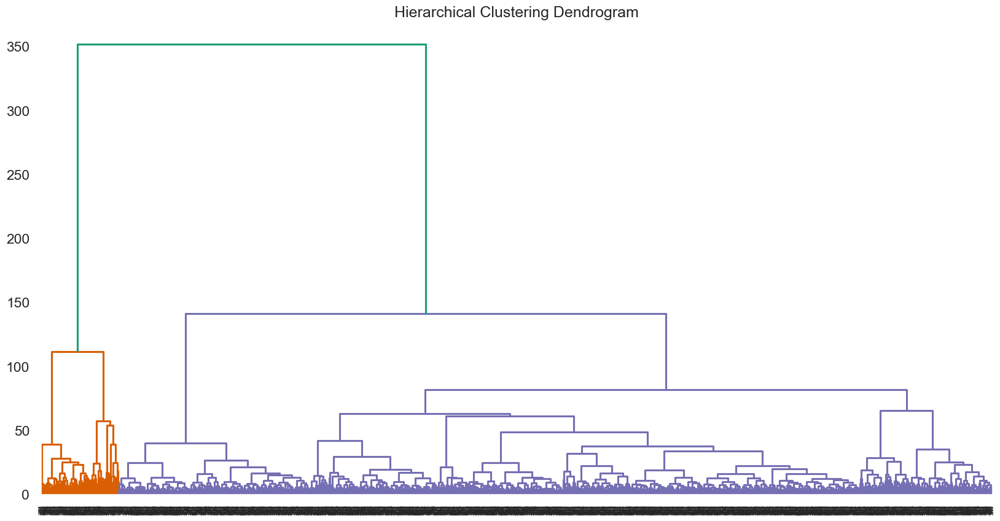

In [119]:
plot_dendrogram(success_rb, 'ward')

In [11]:
success['rb_ward2'] = AgglomerativeClustering(
    linkage='ward', n_clusters=2
    ).fit_predict(success_rb)

success['rb_ward3'] = AgglomerativeClustering(
    linkage='ward', n_clusters=3
    ).fit_predict(success_rb)

In [121]:
clusters_comparison(success, 'no_complete2', 'rb_ward2')

,rb_ward2 0 Cluster,rb_ward2 1 Cluster
no_complete2 0 Cluster,3189,255
no_complete2 1 Cluster,34,34


In [122]:
clusters_comparison(success, 'no_ward2', 'rb_ward2')

,rb_ward2 0 Cluster,rb_ward2 1 Cluster
no_ward2 0 Cluster,1653,171
no_ward2 1 Cluster,1570,118


In [123]:
clusters_comparison(success, 'rb_complete2', 'rb_ward2')

,rb_ward2 0 Cluster,rb_ward2 1 Cluster
rb_complete2 0 Cluster,0,103
rb_complete2 1 Cluster,3223,186


In [124]:
clusters_comparison(success, 'rb_complete2', 'rb_ward3')

,rb_ward3 0 Cluster,rb_ward3 1 Cluster,rb_ward3 2 Cluster
rb_complete2 0 Cluster,103,0,0
rb_complete2 1 Cluster,186,2515,708


In [22]:
groupby_mean(success, 'rb_ward3')

rb_ward3,0,1,2
Course area_Art,0.190311,0.051292,0.072034
Course area_Business sciences,0.235294,0.222664,0.128531
Course area_Engineering and related techniques,0.020761,0.029821,0.046610
Course area_Health,0.051903,0.185686,0.398305
Course area_Information and journalism,0.010381,0.073559,0.131356
Course area_Personal services,0.020761,0.054871,0.084746
Course area_Social services,0.200692,0.151093,0.066384
Course area_Teacher training/trainers and education sciences,0.034602,0.053280,0.031073
Course area_Veterinary sciences,0.072664,0.094235,0.039548
Marital status,0.795848,0.879920,0.992938


##### Average

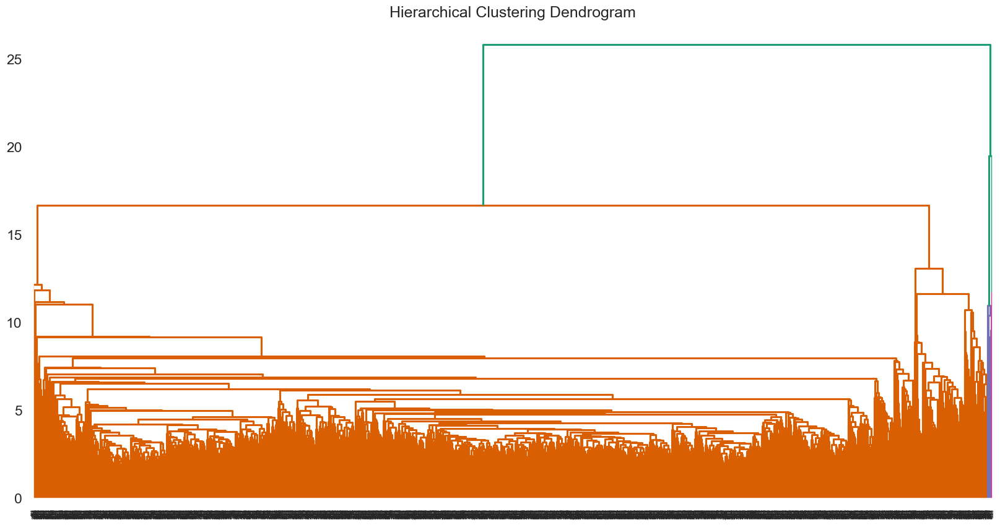

In [125]:
plot_dendrogram(success_rb, 'average')

In [126]:
success['rb_average2'] = AgglomerativeClustering(
    linkage='average', n_clusters=2
    ).fit_predict(success_rb)

In [127]:
clusters_comparison(success, 'rb_ward2', 'rb_average2')

,rb_average2 0 Cluster,rb_average2 1 Cluster
rb_ward2 0 Cluster,0,3223
rb_ward2 1 Cluster,19,270


In [128]:
clusters_comparison(success, 'rb_complete2', 'rb_average2')

,rb_average2 0 Cluster,rb_average2 1 Cluster
rb_complete2 0 Cluster,19,84
rb_complete2 1 Cluster,0,3409


In [129]:
clusters_comparison(success, 'no_complete2', 'rb_average2')

,rb_average2 0 Cluster,rb_average2 1 Cluster
no_complete2 0 Cluster,15,3429
no_complete2 1 Cluster,4,64


##### MeanShift

In [14]:
rb_meanshift = MeanShift(bandwidth=7, bin_seeding=True, n_jobs=-1).fit(success_rb)
success['rb_meanshift'] = rb_meanshift.labels_
success['rb_meanshift'].value_counts()

rb_meanshift
0    3226
1     286
Name: count, dtype: int64

In [14]:
clusters_comparison(success, 'rb_ward2', 'rb_meanshift')

,rb_meanshift 0 Cluster,rb_meanshift 1 Cluster
rb_ward2 0 Cluster,3223,0
rb_ward2 1 Cluster,3,286


##### UMAP

c:\Users\Afonso Cadete\anaconda3\envs\ml\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:387: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles = [plt.scatter([], [], c=cmap(norm(i)), label=label) for i, label in enumerate(labels)]


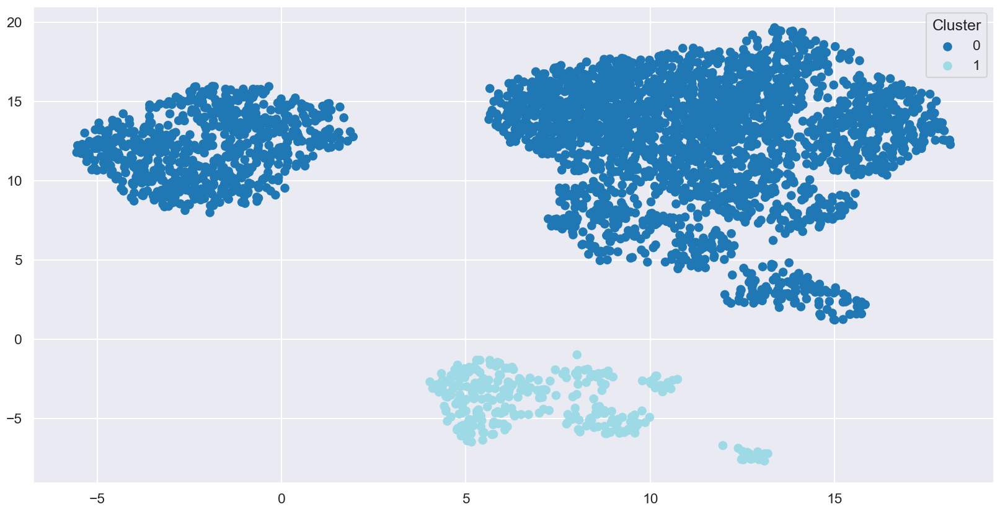

In [15]:
umap_object = umap.UMAP(n_neighbors=16, min_dist=1, random_state=16, n_jobs=-1)
umap_embedding = umap_object.fit_transform(success_rb)
visualize_dimensionality_reduction(umap_embedding, success['rb_meanshift'])

#### Means

In [149]:
groupby_mean(success, 'rb_meanshift', True)

rb_meanshift,0,1,MEAN
Course area_Art,0.055797,0.192308,0.066913
Course area_Business sciences,0.201798,0.237762,0.204727
Course area_Engineering and related techniques,0.033478,0.020979,0.032460
Course area_Health,0.232176,0.052448,0.217540
Course area_Information and journalism,0.086175,0.010490,0.080011
Course area_Personal services,0.061376,0.020979,0.058087
Course area_Social services,0.133292,0.192308,0.138098
Course area_Teacher training/trainers and education sciences,0.048357,0.034965,0.047267
Course area_Veterinary sciences,0.082145,0.073427,0.081435
Marital status,0.904836,0.793706,0.895786


# Profiling

In [16]:
insuccess_clusters_mapping = {
    0: '1st period unsuccessful',
    1: 'Both periods unsuccessful',
    2: '2nd period unsuccessful',
    3: 'No university work'
}

success_clusters_mapping = {
    0: 'Streamline successful',
    1: 'Diverse pathways successful'
}

insuccess_scaled = data_transform(MinMaxScaler(), insuccess.iloc[:,:46])[0]
success_scaled = data_transform(MinMaxScaler(), success.iloc[:,:46])[0]

insuccess_scaled['Cluster'] = insuccess['no_single4'].map(insuccess_clusters_mapping)
success_scaled['Cluster'] = success['rb_meanshift'].map(success_clusters_mapping)

## Insuccess

  0%|          | 0/24 [00:00<?, ?it/s]

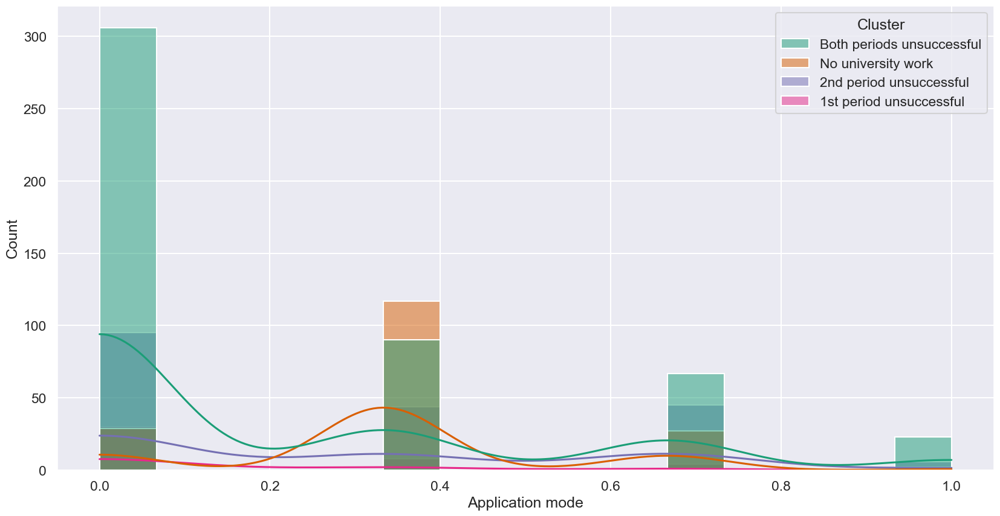

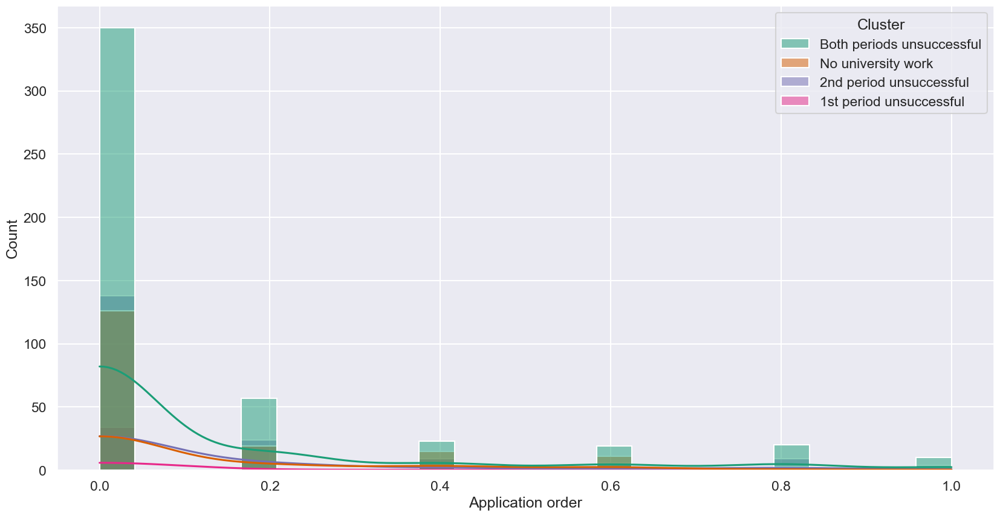

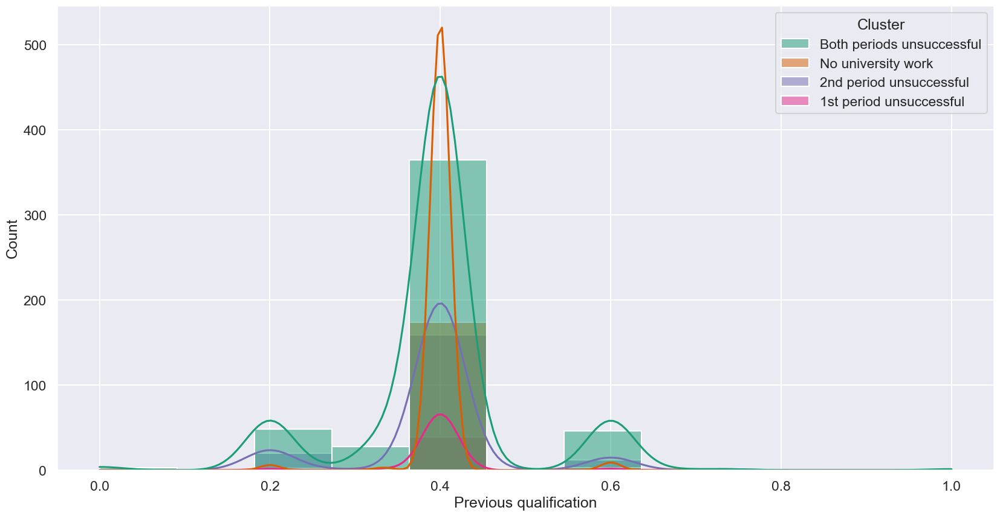

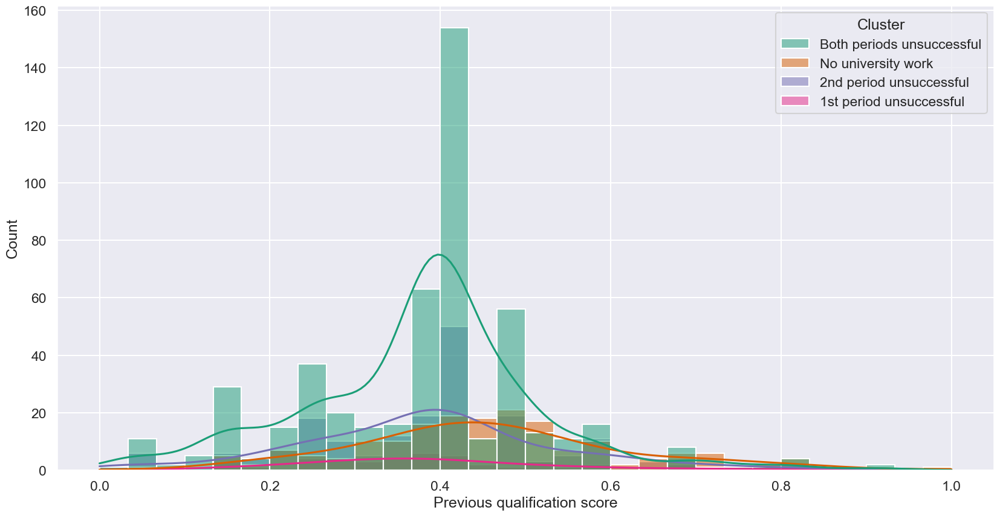

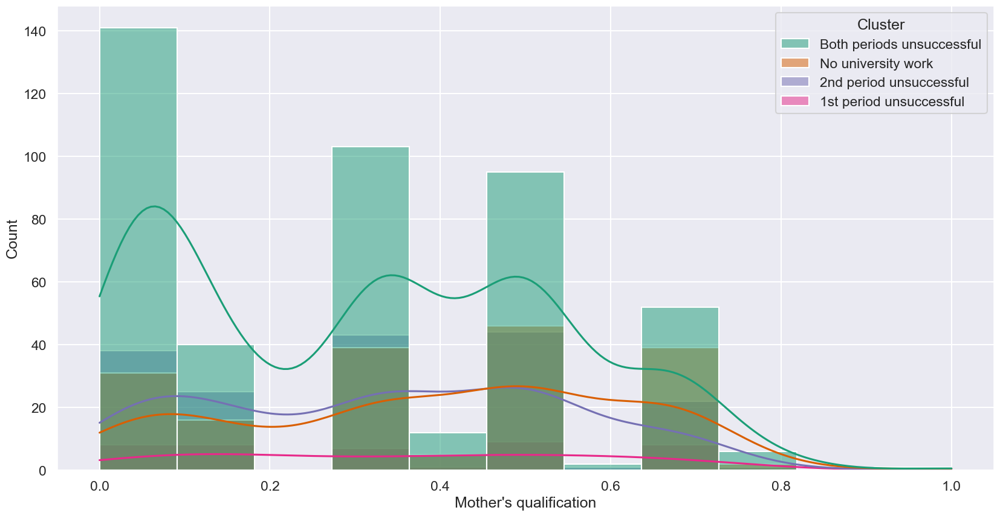

...

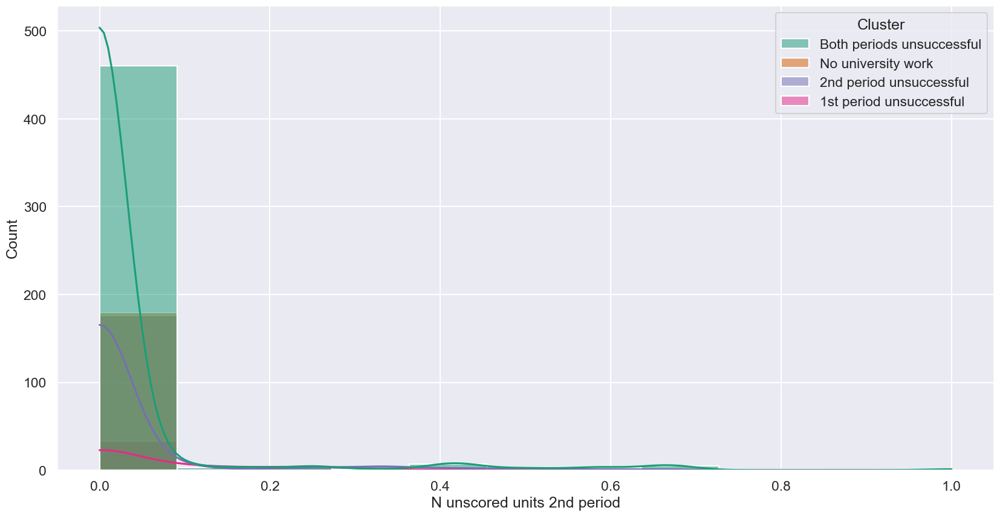

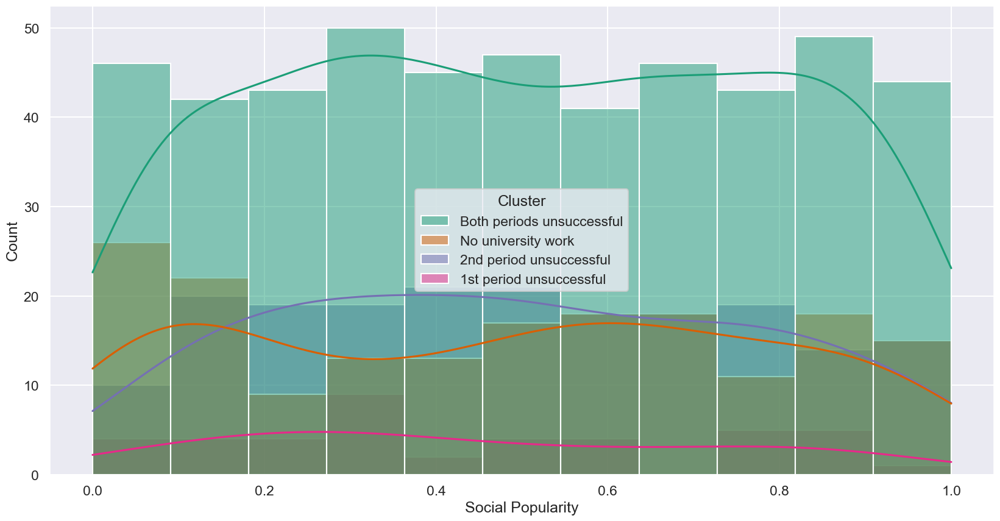

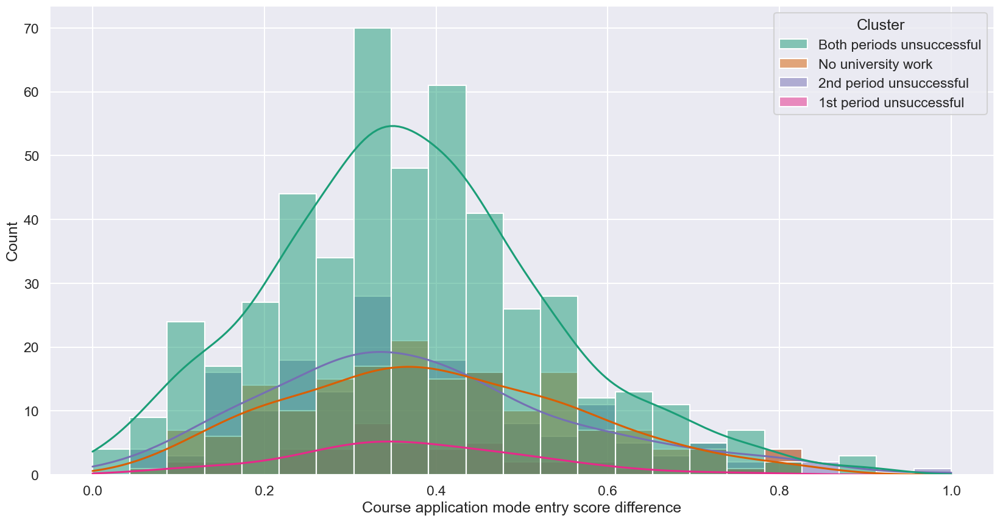

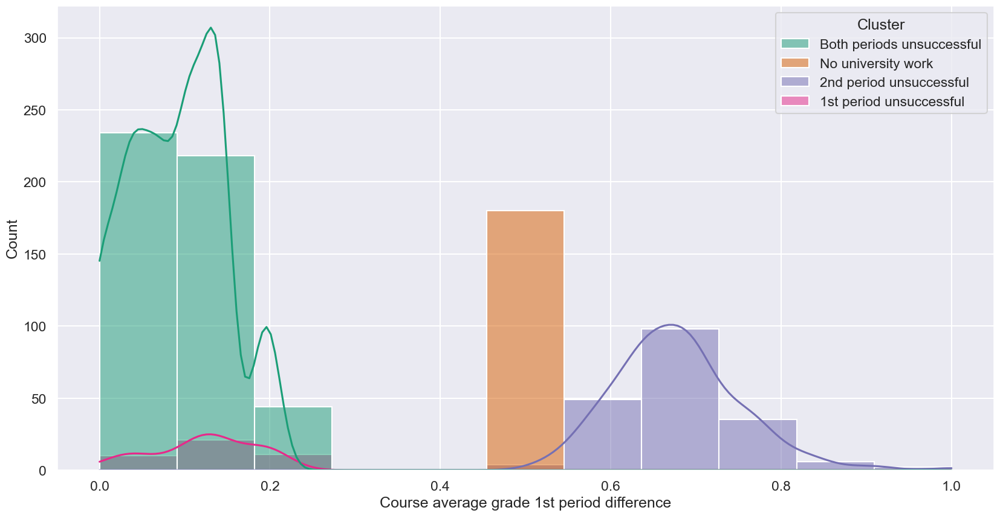

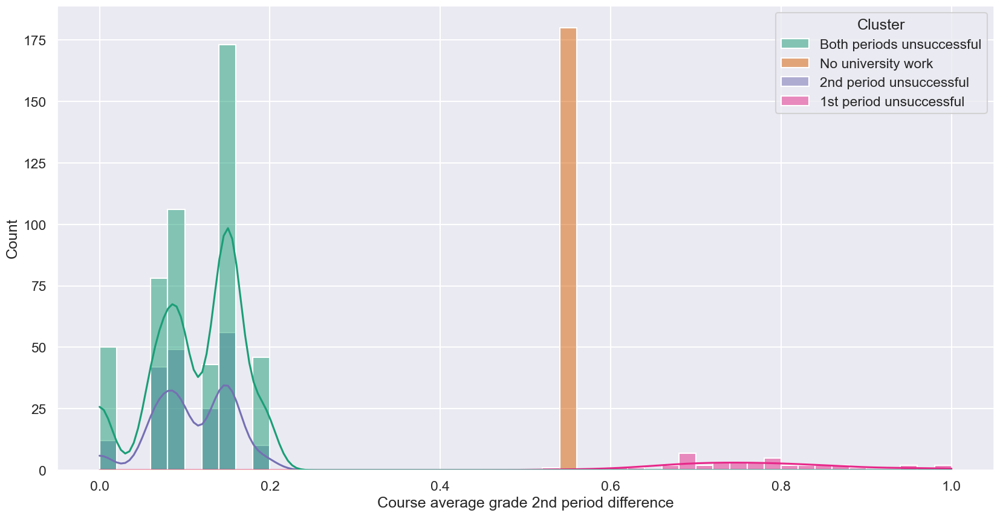

In [43]:
bool_cols = [col for col in insuccess_scaled.columns if insuccess_scaled[col].nunique() == 2]

for i in tqdm(insuccess_scaled.drop(columns=bool_cols+['Cluster']).columns):
    sns.histplot(insuccess_scaled, x=i, hue='Cluster', kde=True, legend=True, palette='Dark2')
    plt.show()

### Performance

g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:452: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette=color)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:466: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_xticklabels(cluster_labels)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:470: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  


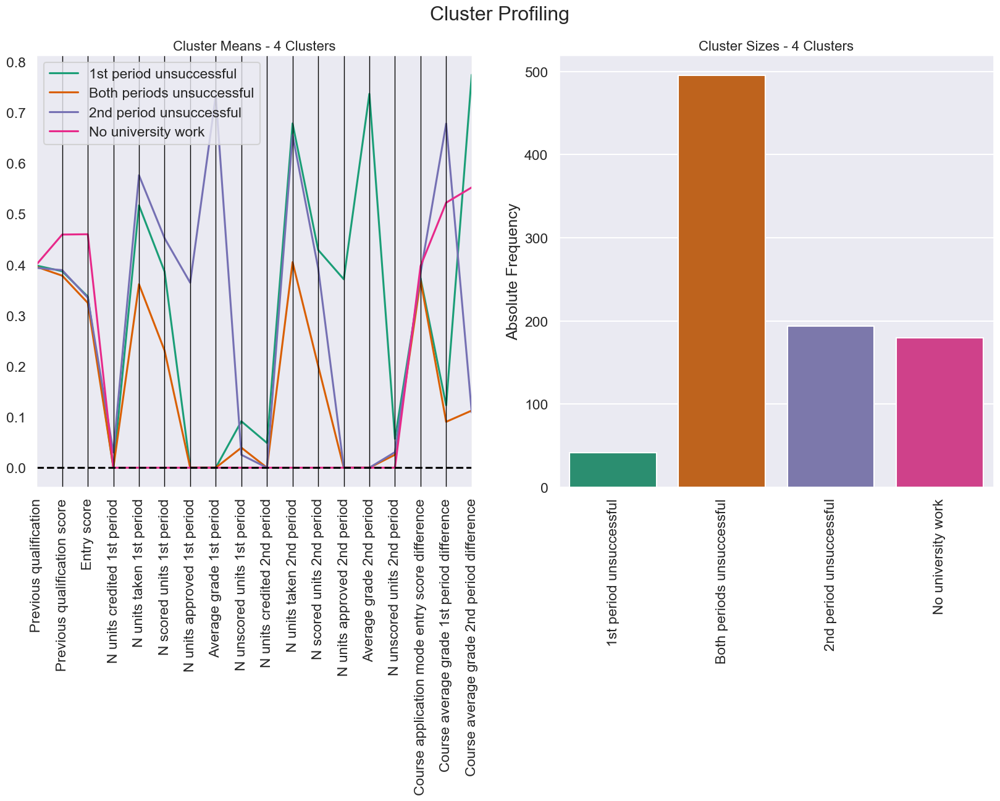

In [166]:
cluster_profiles(insuccess_scaled[performance_cols].join(insuccess['no_single4']), ['no_single4'], cluster_names=insuccess_clusters_mapping)

### Demographic

g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:452: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette=color)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:466: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_xticklabels(cluster_labels)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:470: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  


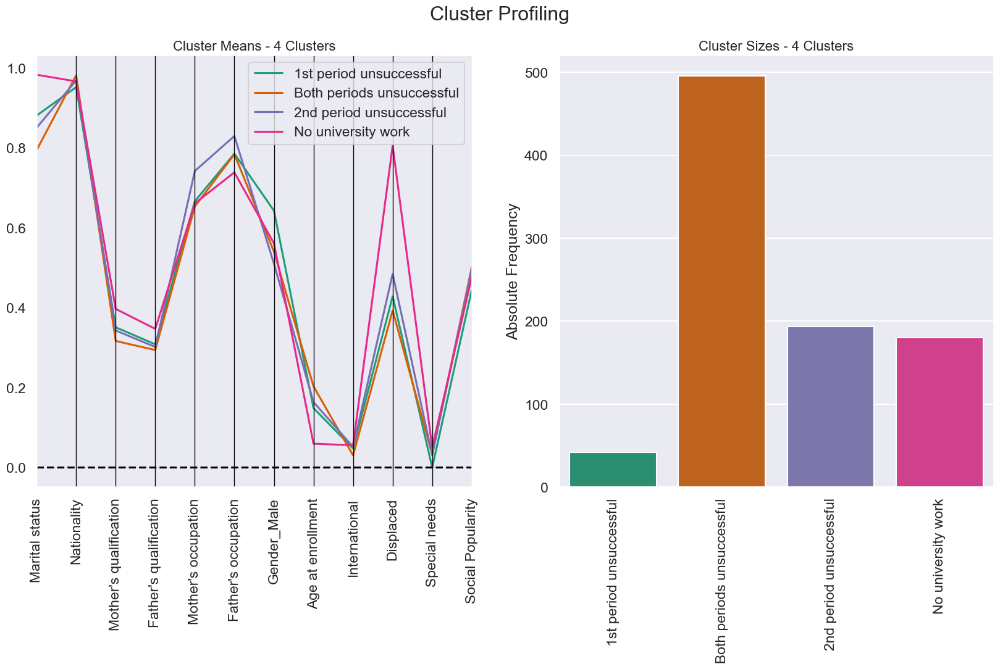

In [152]:
cluster_profiles(insuccess_scaled[demographic_cols].join(insuccess['no_single4']), ['no_single4'], cluster_names=insuccess_clusters_mapping)

#### Financial

g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:452: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette=color)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:466: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_xticklabels(cluster_labels)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:470: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  


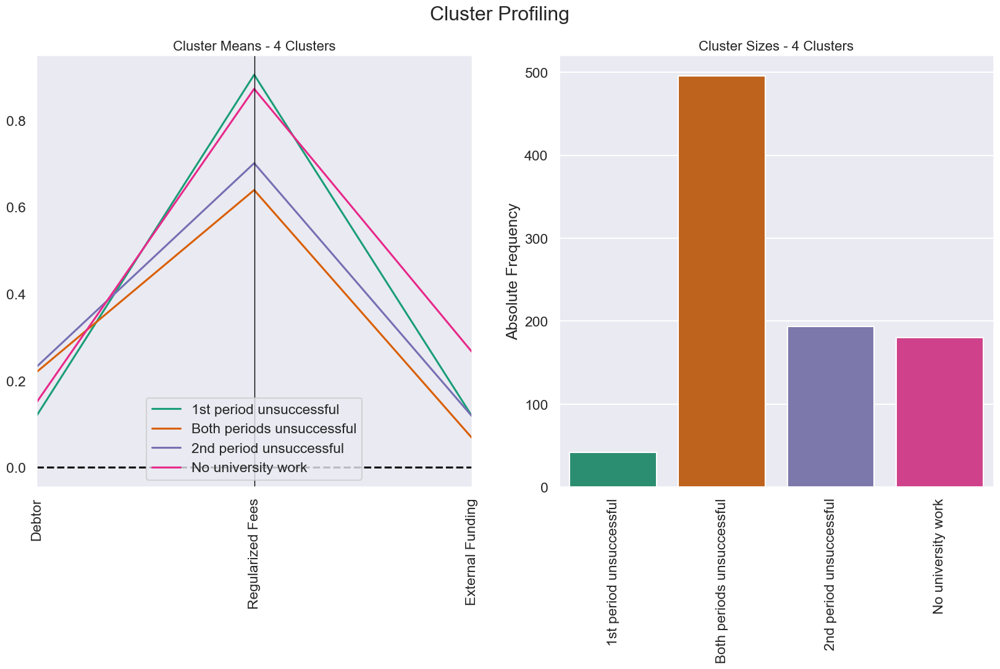

In [153]:
cluster_profiles(insuccess_scaled[financial_cols].join(insuccess['no_single4']), ['no_single4'], cluster_names=insuccess_clusters_mapping)

### Course

g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:452: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette=color)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:466: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_xticklabels(cluster_labels)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:470: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  


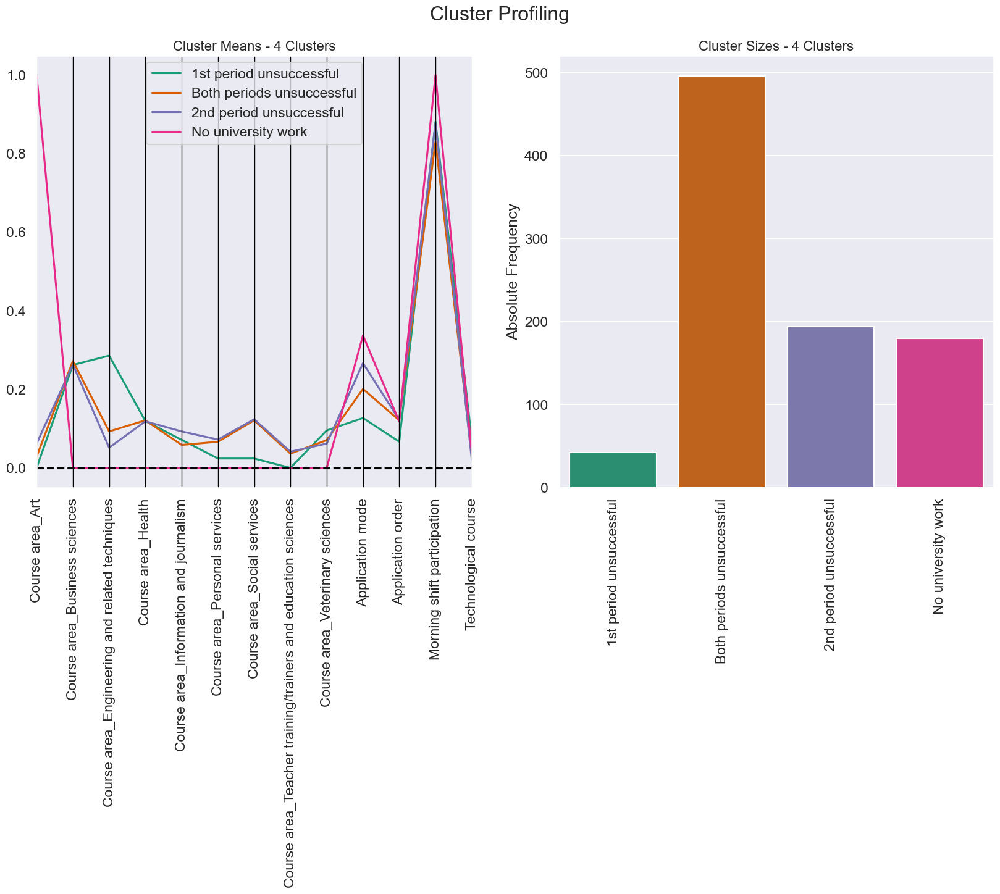

In [154]:
cluster_profiles(insuccess_scaled[course_cols].join(insuccess['no_single4']), ['no_single4'], cluster_names=insuccess_clusters_mapping)

## Success

  0%|          | 0/24 [00:00<?, ?it/s]

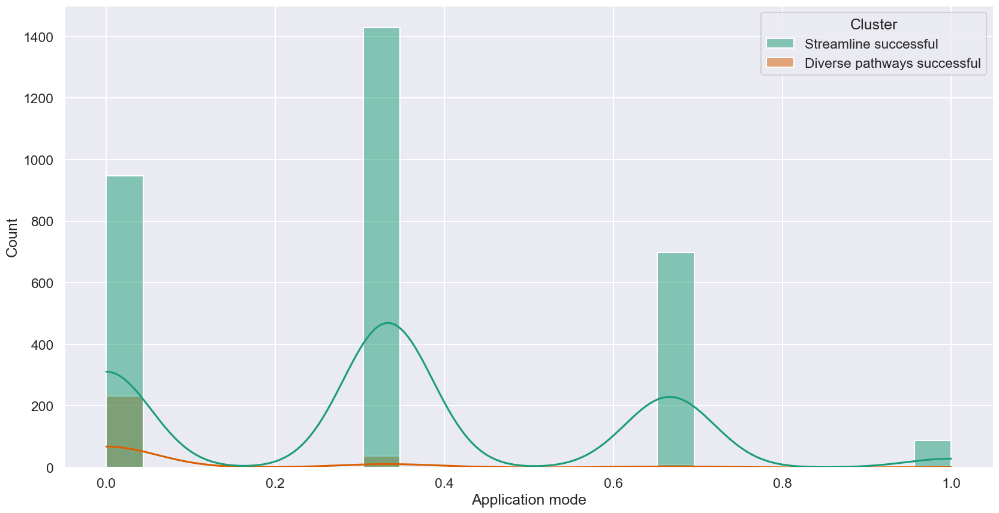

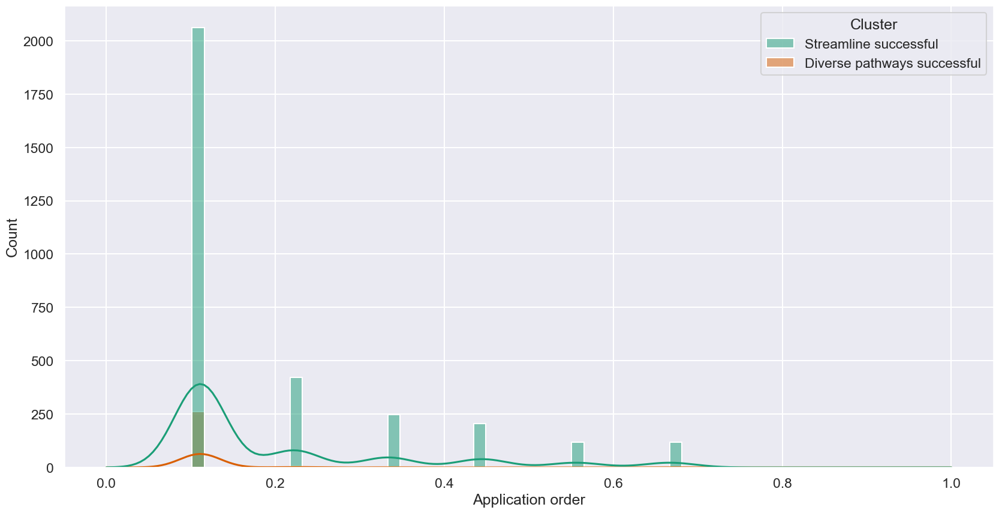

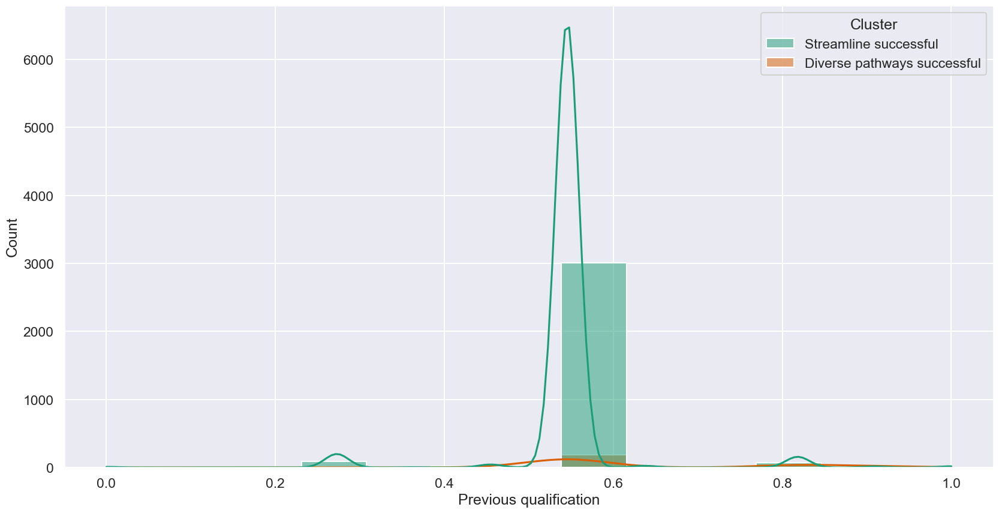

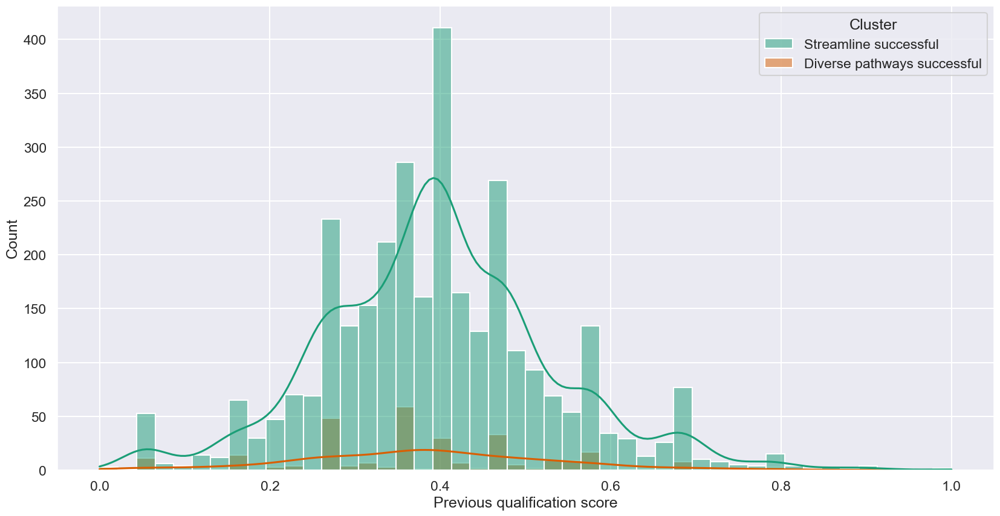

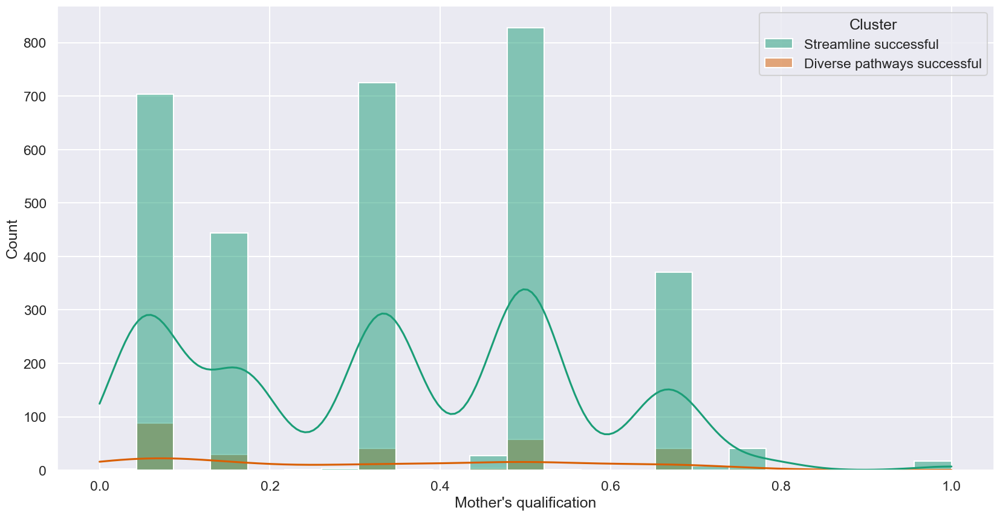

...

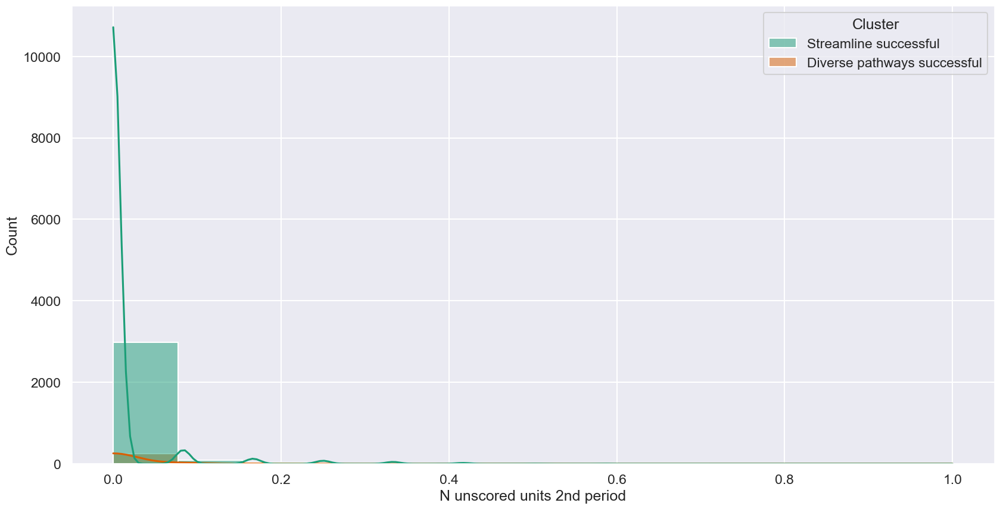

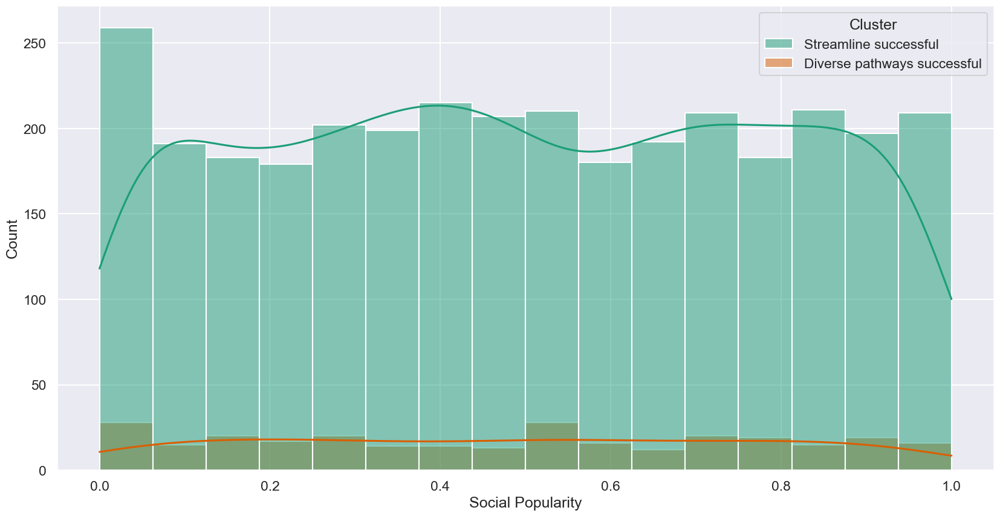

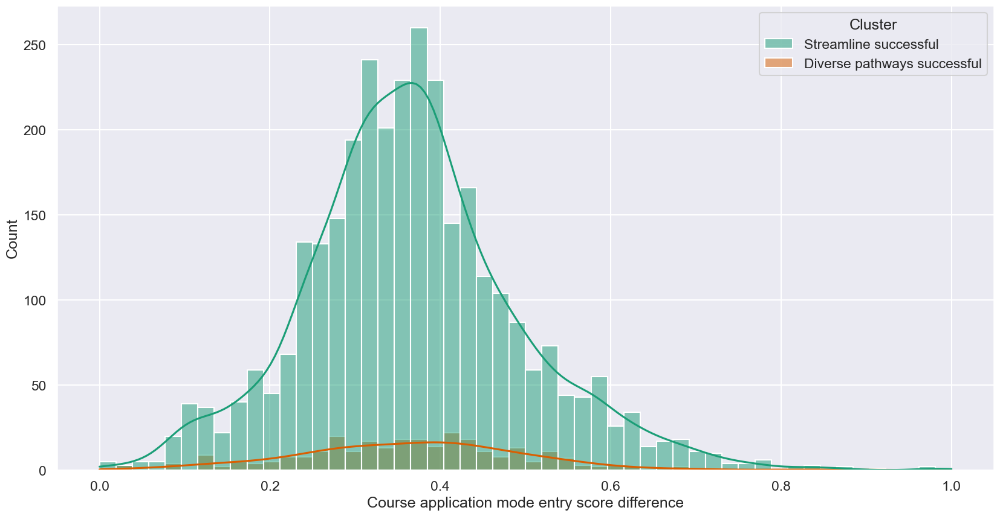

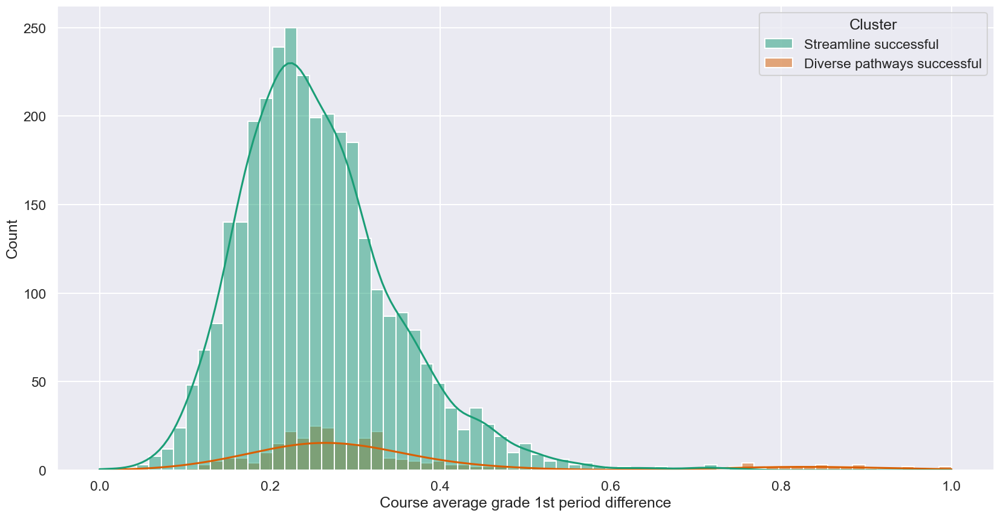

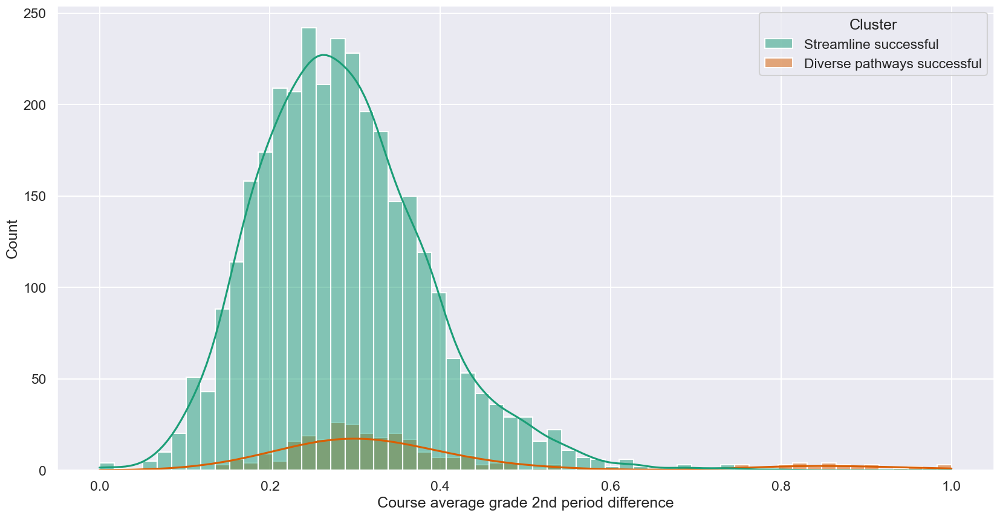

In [174]:
for i in tqdm(success_scaled.drop(columns=bool_cols+['Cluster']).columns):
    sns.histplot(success_scaled, x=i, hue='Cluster', kde=True, legend=True, palette='Dark2')
    plt.show()

### Performance

g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:452: UserWarning: The palette list has more values (8) than needed (2), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette=color)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:466: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_xticklabels(cluster_labels)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:470: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  


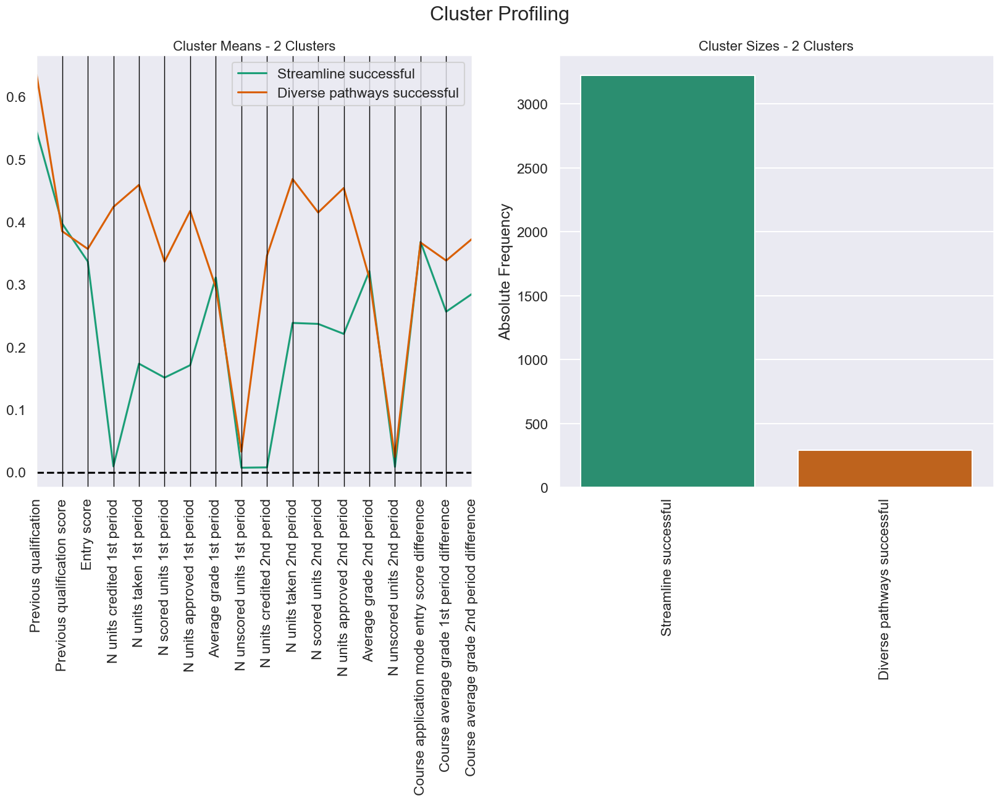

In [158]:
cluster_profiles(success_scaled[performance_cols].join(success['rb_ward2']), ['rb_ward2'], cluster_names=success_clusters_mapping)

### Demographic

g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:452: UserWarning: The palette list has more values (8) than needed (2), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette=color)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:466: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_xticklabels(cluster_labels)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:470: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  


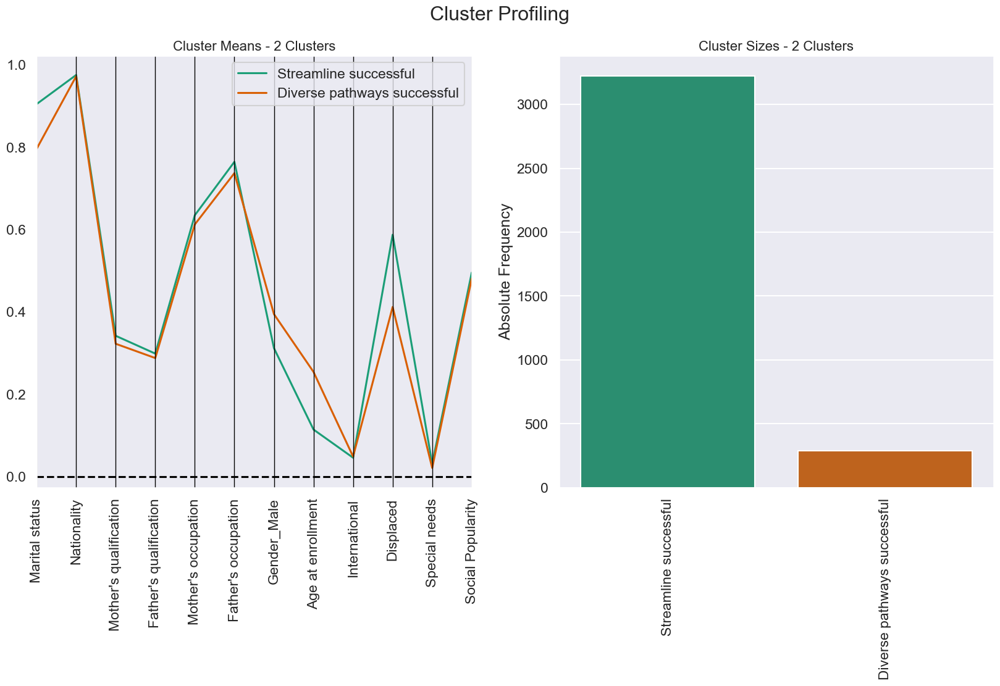

In [159]:
cluster_profiles(success_scaled[demographic_cols].join(success['rb_ward2']), ['rb_ward2'], cluster_names=success_clusters_mapping)

### Financial

g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:452: UserWarning: The palette list has more values (8) than needed (2), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette=color)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:466: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_xticklabels(cluster_labels)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:470: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  


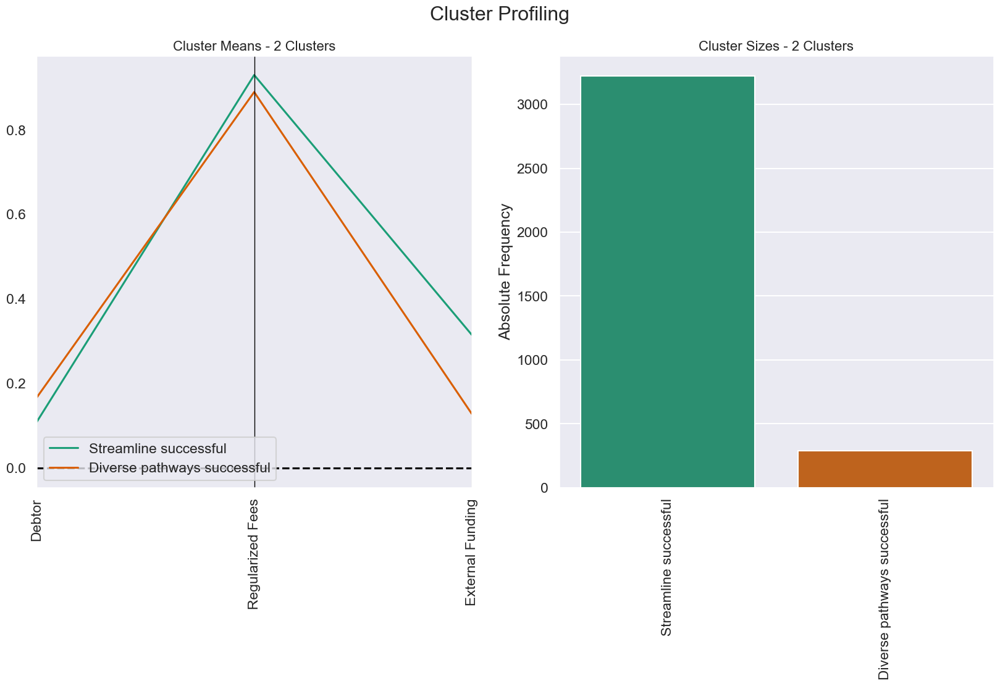

In [160]:
cluster_profiles(success_scaled[financial_cols].join(success['rb_ward2']), ['rb_ward2'], cluster_names=success_clusters_mapping)

### Course

g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:452: UserWarning: The palette list has more values (8) than needed (2), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette=color)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:466: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_xticklabels(cluster_labels)
g:\O meu disco\Universidade\3rd year\2nd semester\Machine Learning\II\Project\utils2.py:470: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  


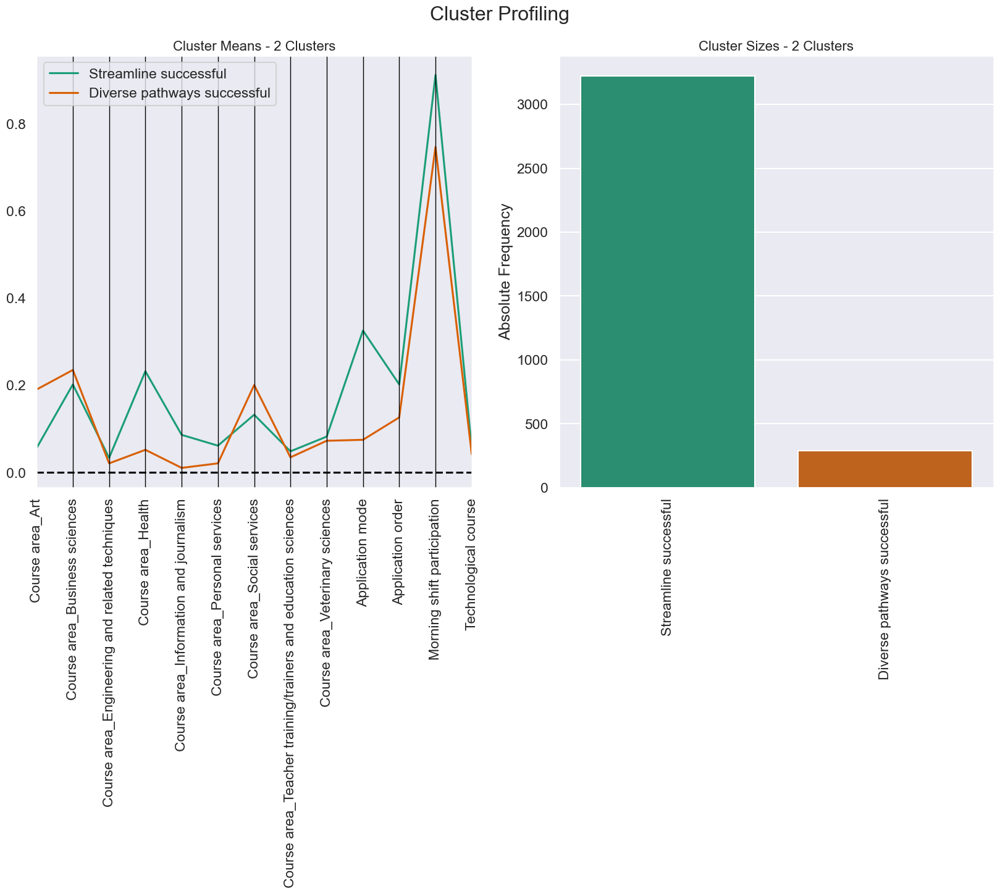

In [161]:
cluster_profiles(success_scaled[course_cols].join(success['rb_ward2']), ['rb_ward2'], cluster_names=success_clusters_mapping)

## All

In [18]:
insuccess_scaled.rename(columns={'Cluster': 'Unsuccess'}, inplace=True)
success_scaled.rename(columns={'Cluster': 'Success'}, inplace=True)

data_scaled = data_transform(MinMaxScaler(), data.iloc[:,:46])[0]
data_scaled = pd.concat([data_scaled, insuccess_scaled['Unsuccess']], axis=1)
data_scaled = pd.concat([data_scaled, success_scaled['Success']], axis=1)
data_scaled['Cluster'] = data_scaled['Success'].combine_first(data_scaled['Unsuccess'])
data_scaled.drop(columns=['Success', 'Unsuccess'], inplace=True)
data_scaled

,Course area_Art,Course area_Business sciences,Course area_Engineering and related techniques,Course area_Health,Course area_Information and journalism,Course area_Personal services,Course area_Social services,Course area_Teacher training/trainers and education sciences,Course area_Veterinary sciences,Marital status,...,N scored units 2nd period,N units approved 2nd period,Average grade 2nd period,N unscored units 2nd period,Social Popularity,Course application mode entry score difference,Course average grade 1st period difference,Course average grade 2nd period difference,Technological course,Cluster
Userid,,,,,,,,,,,,,,,,,,,,,
699,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.333333,0.30,0.630769,0.000000,0.704082,0.429251,0.570894,0.577409,1.0,Streamline successful
456,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.454545,0.10,0.592308,0.083333,0.551020,0.276590,0.491514,0.503999,0.0,Streamline successful
647,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.454545,0.05,0.538462,0.000000,0.673469,0.326329,0.492810,0.464429,0.0,Streamline successful
383,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.363636,0.15,0.556410,0.000000,0.938776,0.326329,0.459124,0.477619,0.0,Streamline successful
1217,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.333333,NaN,0.646154,0.000000,0.428571,0.307866,0.523904,0.543569,0.0,Streamline successful
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4144,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.424242,0.35,0.654231,0.000000,0.438776,0.255123,0.564765,0.583207,0.0,Streamline successful
2761,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.303030,NaN,0.716490,0.000000,0.765306,0.367143,0.507093,0.526526,0.0,Streamline successful
4410,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.181818,0.25,0.771795,0.000000,0.336735,0.314321,0.674936,0.679915,0.0,Streamline successful


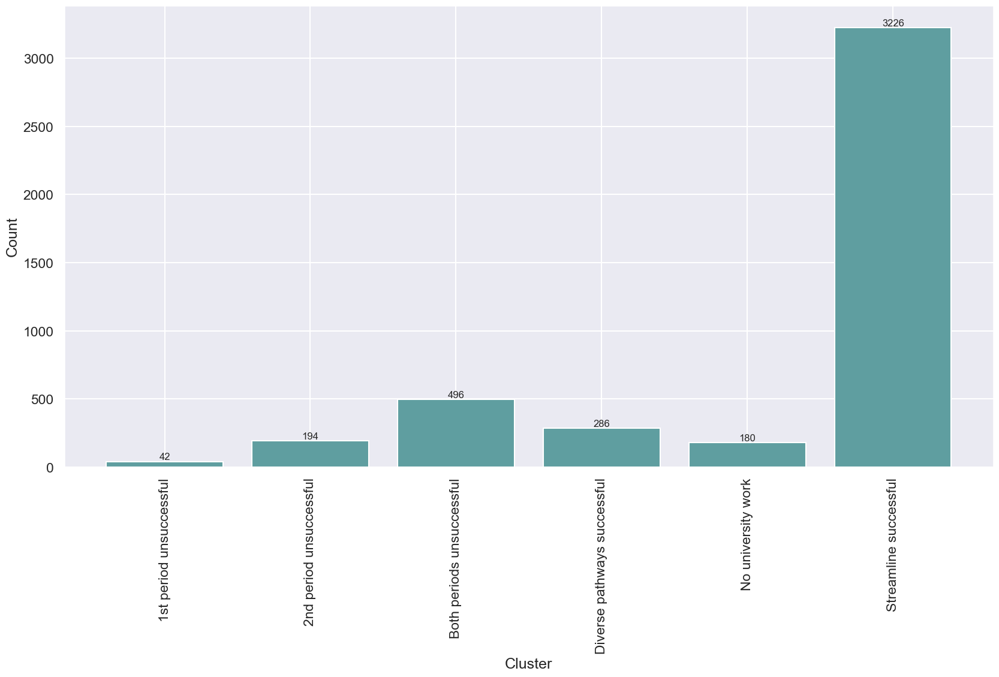

In [19]:
plot_bar_chart(data_scaled, 'Cluster', annotate=True, vertical=True)